In [42]:

import numpy as np
from scipy.signal import argrelextrema
import matplotlib.pyplot as plt
import qcodes
import os, glob
import sys
import pandas as pd
from scipy.signal import find_peaks

from qcodes.dataset import (
    initialise_or_create_database_at,
    load_or_create_experiment,    
    plot_by_id,
    load_by_run_spec
)


In this Notebook we analyse the Resonance Spectrum of our TiN resonators. 
We'll first plot the transmission coefficient $S_{21}$ in function of the frequency. 
We then will identify the local minima, which are candidates for being resonances and then we'll check if some of this renonances have Lorentzian Shape with a notch_port fit. 
The fit is accessible on the Resonator_Tools Git Hub and the main idea behind it is that since for resonances the phase sweeps all the values from 0 to $2 \pi$ , its complex representation will be a circle. The algorythm fits precisely that circle. 

The reason why the resonances configure as minima in the spectrum is quite simple, we see transmission of the singnal if no resonator absorbs the input signal. For resonance frequency one resonator will absorb the signal and so we'll se a dip in the transmission output. The transmission output is ideally the same of the input if no resonator absorbs the microwave signal we are putting in. 

In [43]:
# Define the path to your database
db_path = r"C:\Users\Nicola\Documents\CdL_Fisica\INTERNSHIP\FBK_superconducting_circuits\23_05\db_Enrico\TiN-Resonators.db"
assert os.path.exists(db_path), f"Database not found at {db_path}" 


In [44]:
# Connect to the database
initialise_or_create_database_at(db_path)


# If the experiment does not exist, it will be created
experiment = load_or_create_experiment(experiment_name="resonator_experiment", sample_name="test_sample")

# List available datasets in the experiment
experiment.data_sets()

[]

In [45]:
# Replace with the actual run ID you want to load: I want to study run 12 and 15 
run_id = 1
dataset = load_by_run_spec(captured_run_id=run_id)
dataset

print("\n")

data = dataset.get_parameter_data()

# Print all the available parameter names and their shapes
for group, params in data.items():
    print(f"\nGroup: {group}")
    for param, values in params.items():
        print(f" - {param}: shape {np.shape(values)}")





Group: VNA_S21_magnitude
 - VNA_S21_magnitude: shape (10001,)
 - VNA_S21_S21_frequency: shape (10001,)

Group: VNA_S21_phase
 - VNA_S21_phase: shape (10001,)
 - VNA_S21_S21_frequency: shape (10001,)


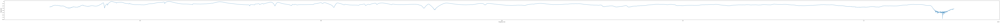

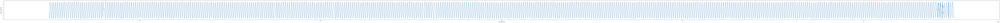

In [46]:
#I plot the data at different powers 

# Extract the data 
freq_trace  = data['VNA_S21_magnitude']['VNA_S21_S21_frequency']
mag_trace   = data['VNA_S21_magnitude']['VNA_S21_magnitude']
phase_trace = data['VNA_S21_phase']['VNA_S21_phase']

plt.figure(figsize=(200, 4))
plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.show()

plt.figure(figsize=(200, 4))
plt.plot(freq_trace, phase_trace, label='Phase (radiants)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase (Radiants)')
plt.show()

We herby want to study the spectrum of resonances we just plotted. 
The first thing we are going to do is designing an algorythm to find the resonances. 
Afterwards, in order to understand if they display the expected Lorentzian behaviour, we are going to perform a notch-port fit on them. 

In [47]:
# --- Function to find resonance frequencies in a single trace ---
def find_resonances(frequency, magnitude, phase, order, phase_threshold):
    """
    Identify resonances where magnitude has a local minimum and phase inverts by ~2π.

    Parameters:
    - frequency: 1D array of frequency values
    - magnitude: 1D array of magnitude values (linear scale or dB)
    - phase:     1D array of phase values (radians)
    - order:     How many points on each side to use for local minima detection
    - phase_threshold: jump magnitude threshold to call a full inversion (default π)

    Returns:
    - indices:  Indices of resonance centers in the trace
    - freqs:    Corresponding frequency values
    """
    # 1. Find local minima in the magnitude
    local_min_idx = argrelextrema(magnitude, np.less, order=order)[0]
    print(f"Found {len(local_min_idx)} candidate minima before phase filtering")

    # 2. Unwrap phase to get continuous jumps
    unph = np.unwrap(phase)

    # 3. Check phase jumps around each local minimum
    res_idx = []
    for idx in local_min_idx:
        # ensure we can look ahead/behind by 'order' points
        if idx < order or idx >= len(phase) - order:
            continue
        window = unph[idx - order: idx + order ]
        dphi = np.max(window) - np.min(window)
        if dphi > phase_threshold:
            res_idx.append(idx)
        print(f"idx={idx}, dphi={dphi:.2f}, freq={frequency[idx]/1e9:.6f} GHz")

    return np.array(res_idx), frequency[res_idx]


Found 105 candidate minima before phase filtering
idx=123, dphi=8.70, freq=3.123000 GHz
idx=215, dphi=8.06, freq=3.215000 GHz
idx=300, dphi=8.26, freq=3.300000 GHz
idx=417, dphi=8.40, freq=3.417000 GHz
idx=507, dphi=8.26, freq=3.507000 GHz
idx=607, dphi=7.50, freq=3.607000 GHz
idx=640, dphi=8.49, freq=3.640000 GHz
idx=738, dphi=8.61, freq=3.738000 GHz
idx=878, dphi=8.82, freq=3.878000 GHz
idx=955, dphi=8.50, freq=3.955000 GHz
idx=985, dphi=8.58, freq=3.985000 GHz
idx=1038, dphi=8.39, freq=4.038000 GHz
idx=1273, dphi=8.49, freq=4.273000 GHz
idx=1579, dphi=8.49, freq=4.579000 GHz
idx=1663, dphi=8.57, freq=4.663000 GHz
idx=1801, dphi=8.61, freq=4.801000 GHz
idx=2212, dphi=8.33, freq=5.212000 GHz
idx=2265, dphi=8.45, freq=5.265000 GHz
idx=2323, dphi=8.47, freq=5.323000 GHz
idx=2365, dphi=8.56, freq=5.365000 GHz
idx=2491, dphi=7.05, freq=5.491000 GHz
idx=2674, dphi=8.23, freq=5.674000 GHz
idx=2702, dphi=8.81, freq=5.702000 GHz
idx=2740, dphi=8.39, freq=5.740000 GHz
idx=2794, dphi=8.61, freq

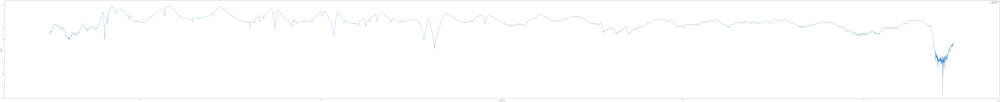

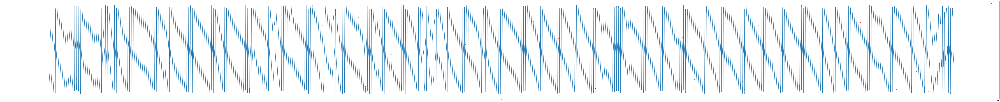

In [48]:



# Extract the data 
freq_trace  = data['VNA_S21_magnitude']['VNA_S21_S21_frequency']
mag_trace   = data['VNA_S21_magnitude']['VNA_S21_magnitude']
phase_trace = data['VNA_S21_phase']['VNA_S21_phase']
unph = np.unwrap(phase_trace)

# Detect resonances
indices, freq_res = find_resonances(freq_trace, mag_trace, phase_trace,
                                   order=15, phase_threshold=np.pi*1.9)

#Visualizzo risultati 

print(f"Detected resonances at frequencies (Hz): {freq_res}")

#print(indices, freq_res)
#print(indices.dtype)


# Optional: Plot the results
plt.figure(figsize=(200, 20))
plt.plot(freq_trace, mag_trace, label='Magnitude (dB)')
if len(indices) > 0:
    plt.scatter(freq_res, mag_trace[indices], color='red', marker='x', label='Resonances')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.legend()
    plt.show()
    
plt.figure(figsize=(200, 20))
plt.plot(freq_trace, phase_trace, label='Phase')
if len(indices) > 0:
    plt.scatter(freq_res, phase_trace[indices], color='red', marker='x', label='Resonances')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase')
    plt.legend()
    plt.show()
    

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import qcodes
import os, glob
import sys
import pandas as pd
from scipy.signal import find_peaks

from qcodes.dataset import (
    initialise_or_create_database_at,
    load_or_create_experiment,    
    plot_by_id,
    load_by_run_spec)



notebook_dir = os.path.dirname(os.path.abspath('__file__'))  #Most robust in notebooks
# If the above line doesn't work try:
# notebook_dir = os.path.abspath('.')
# notebook_dir = os.getcwd()

# 2.  Normalize the path (just in case)
notebook_dir = os.path.normpath(notebook_dir)

# 3.  Add it to sys.path (at the beginning is safest)
if notebook_dir not in sys.path:
    sys.path.insert(0, notebook_dir)

#print("Current sys.path:")
#print(sys.path)  # <--- VERY IMPORTANT: Print sys.path to debug!

# 4.  NOW try your import
from resonator_tools import circuit 
from circuit import reflection_port
from circuit import notch_port



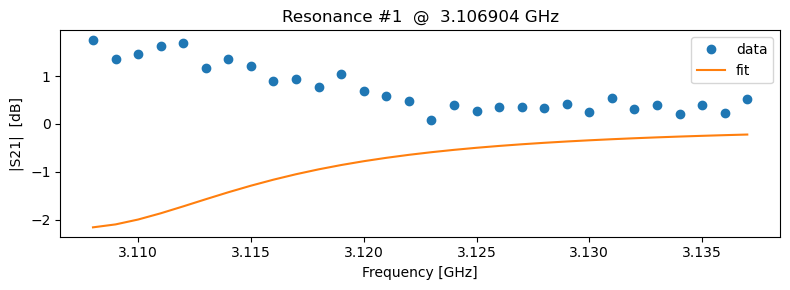

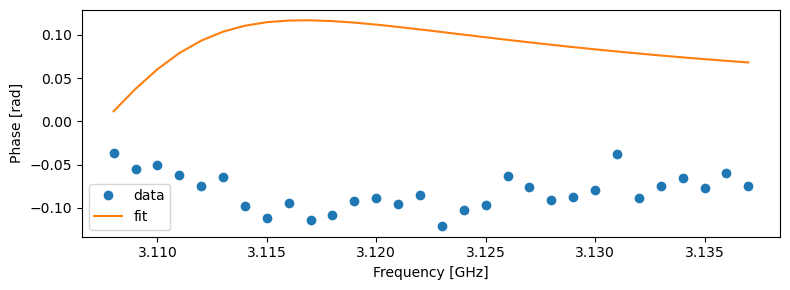

#1:  fr =  3.106904e+09 Hz   Ql = 150.7   |Qc| = 679.2   φ0 = 0.065


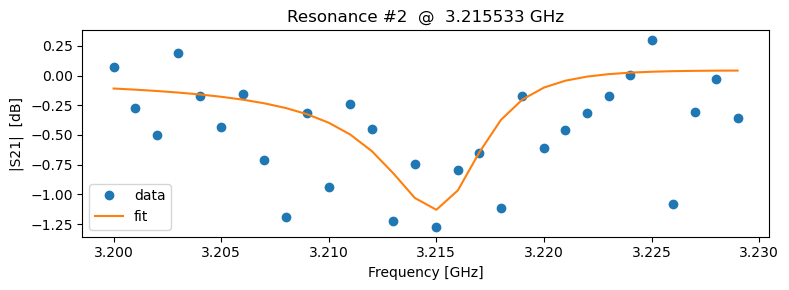

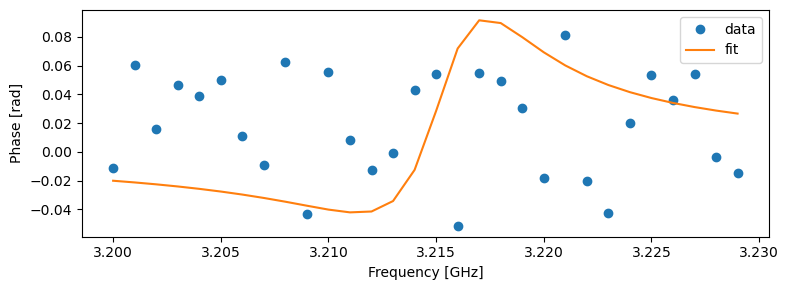

#2:  fr =  3.215533e+09 Hz   Ql = 546.7   |Qc| = 4309.2   φ0 = -0.381


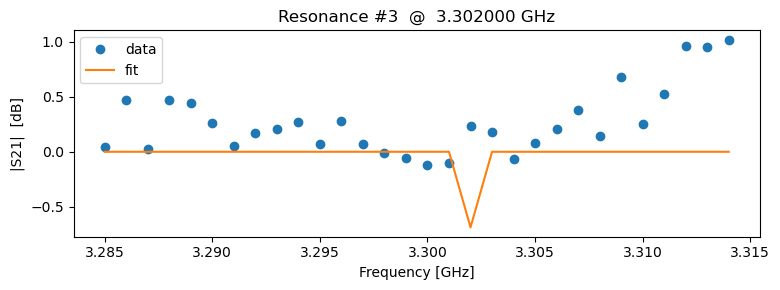

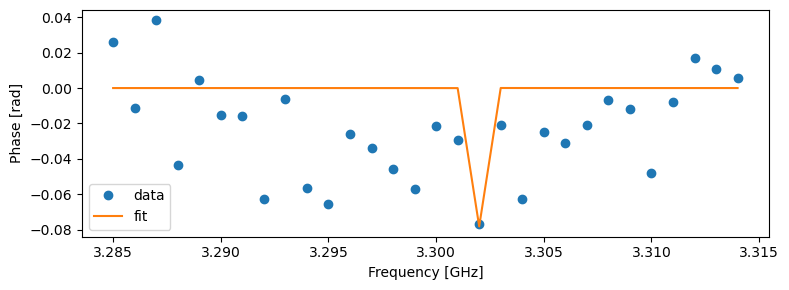

#3:  fr =  3.302000e+09 Hz   Ql = 5765900.0   |Qc| = 48767098.7   φ0 = 0.299


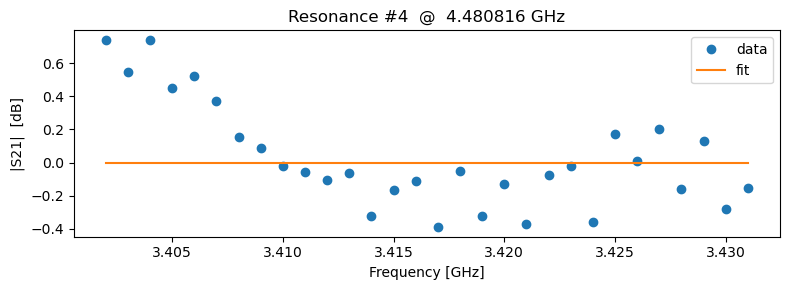

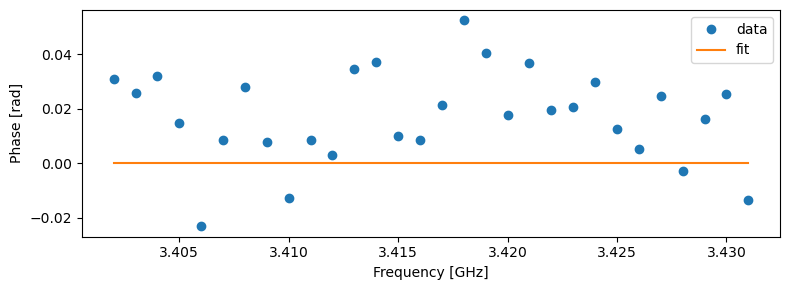

#4:  fr =  4.480816e+09 Hz   Ql = 14676684910493.9   |Qc| = 110275921646765.0   φ0 = -1.192


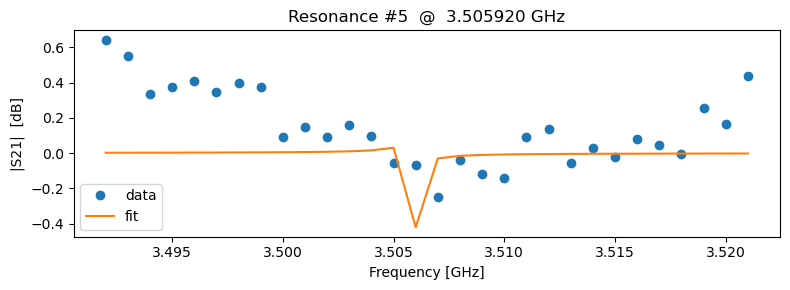

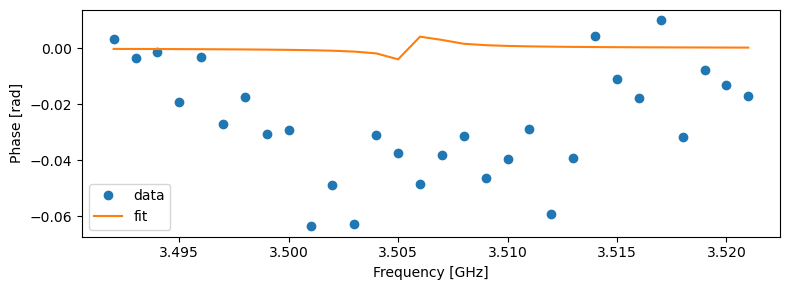

#5:  fr =  3.505920e+09 Hz   Ql = 26659.3   |Qc| = 356838.5   φ0 = 0.800


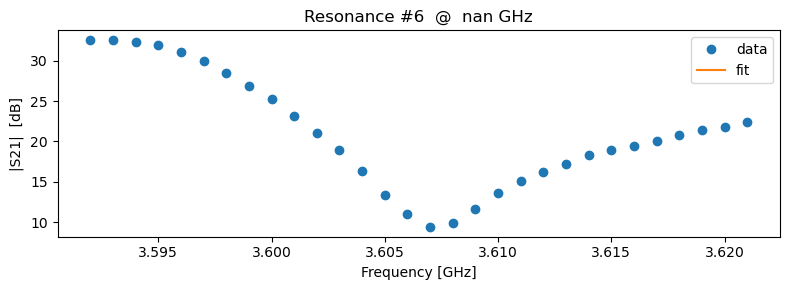

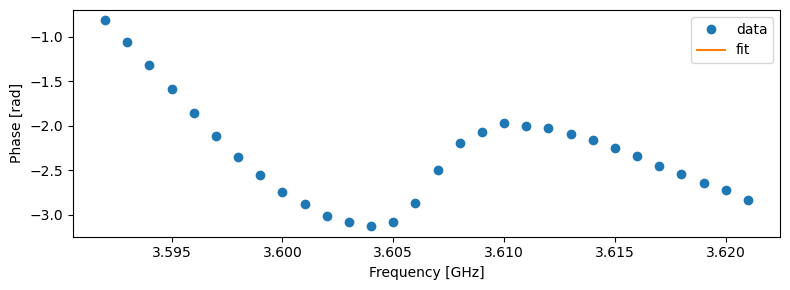

#6:  fr =  nan Hz   Ql = nan   |Qc| = nan   φ0 = nan


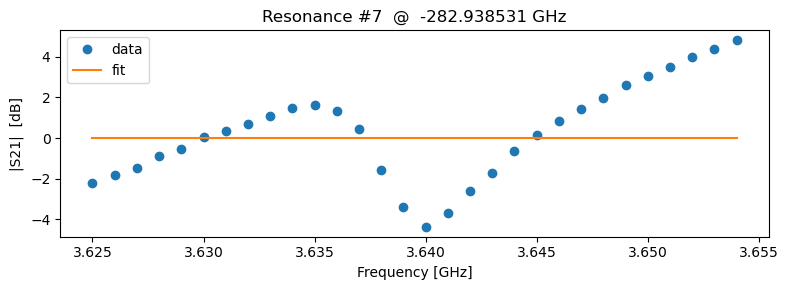

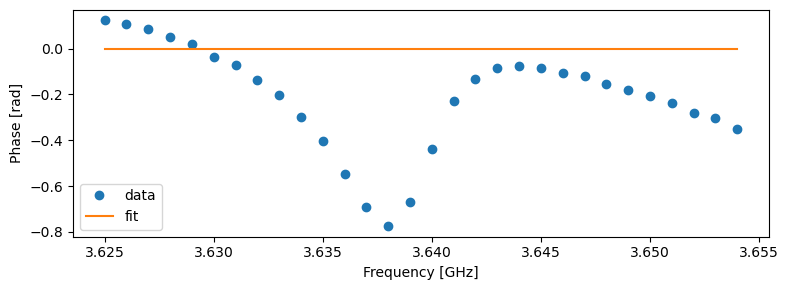

#7:  fr = -2.829385e+11 Hz   Ql = 1020018093.5   |Qc| = 1098545441.5   φ0 = 1.554


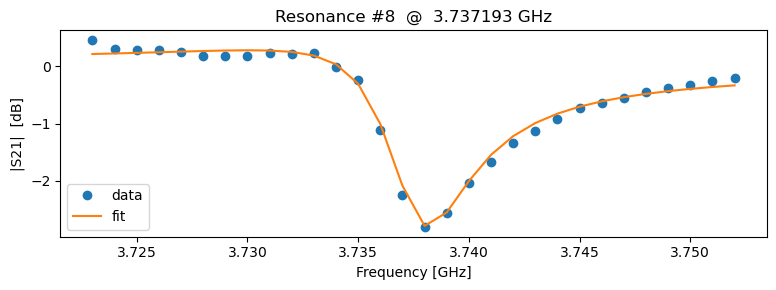

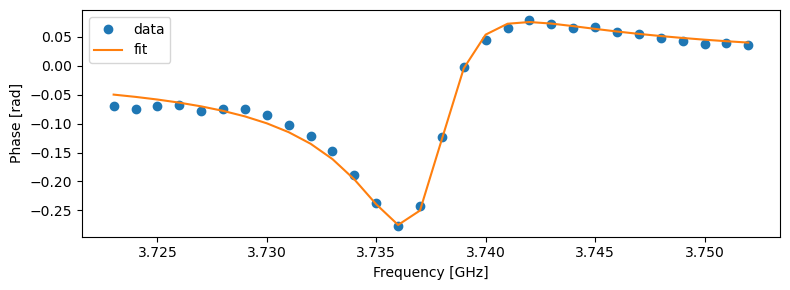

#8:  fr =  3.737193e+09 Hz   Ql = 706.6   |Qc| = 2293.5   φ0 = 0.613


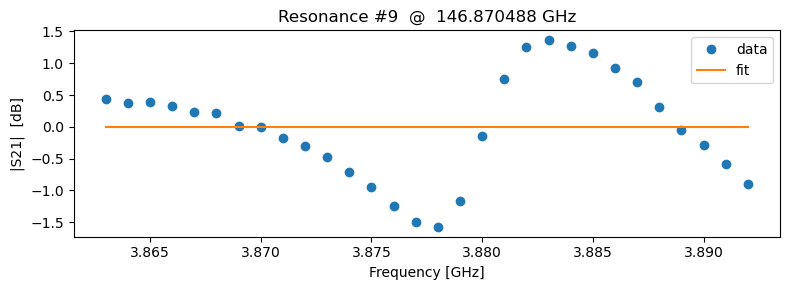

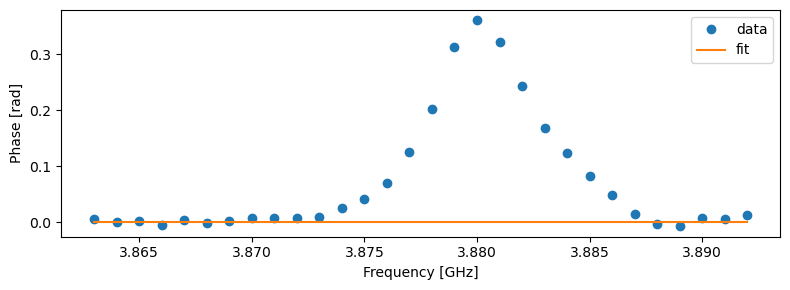

#9:  fr =  1.468705e+11 Hz   Ql = 3111499160.8   |Qc| = 8884065053.7   φ0 = -1.504


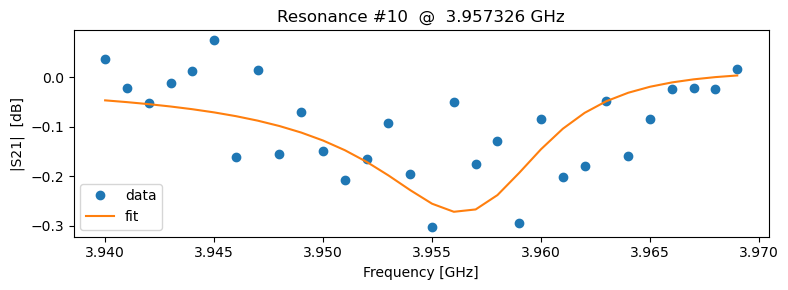

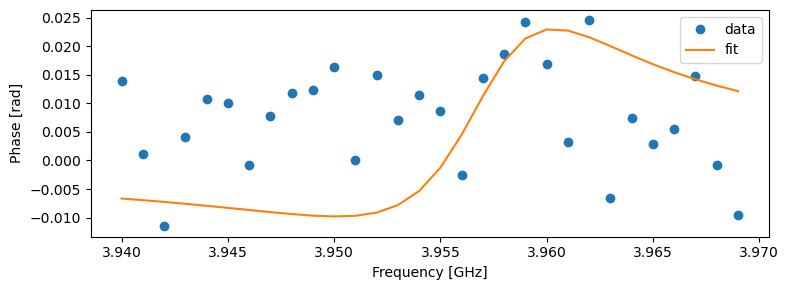

#10:  fr =  3.957326e+09 Hz   Ql = 418.1   |Qc| = 12937.3   φ0 = -0.415


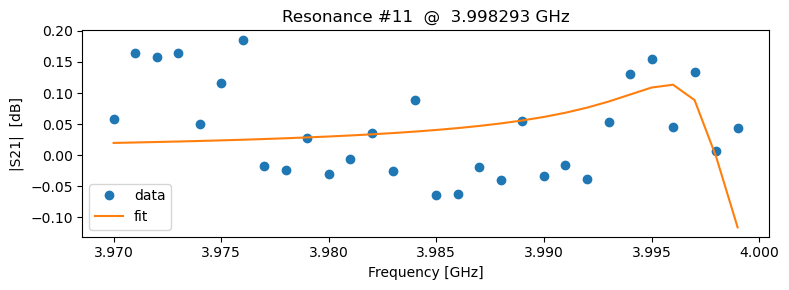

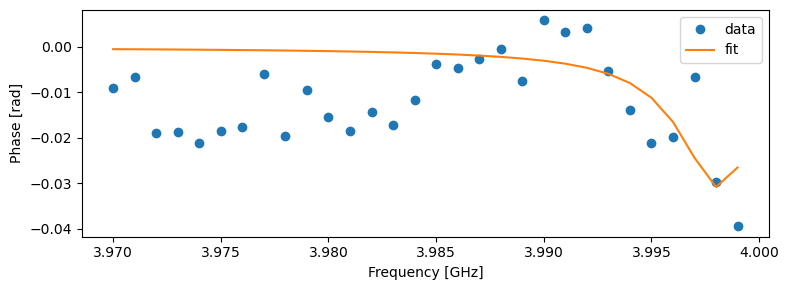

#11:  fr =  3.998293e+09 Hz   Ql = 935.3   |Qc| = 30084.4   φ0 = 1.411


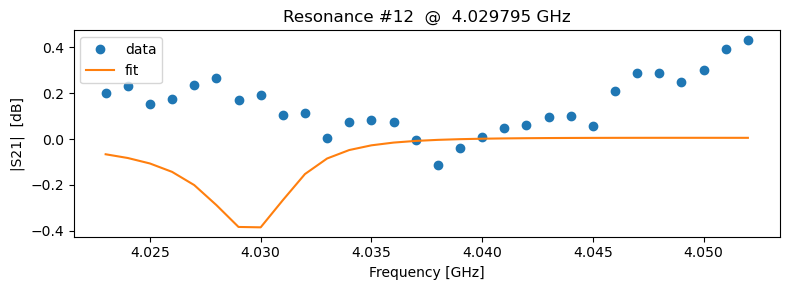

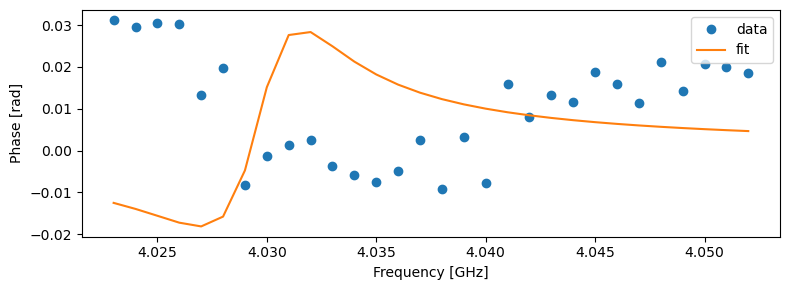

#12:  fr =  4.029795e+09 Hz   Ql = 885.8   |Qc| = 19251.3   φ0 = -0.231


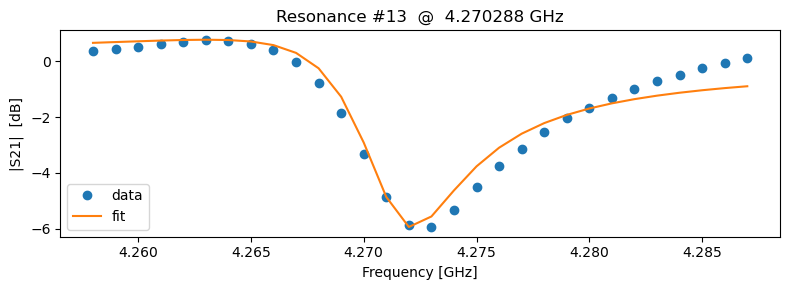

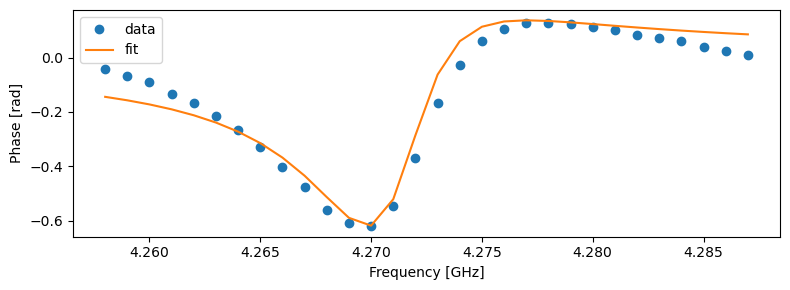

#13:  fr =  4.270288e+09 Hz   Ql = 579.2   |Qc| = 981.9   φ0 = 0.704


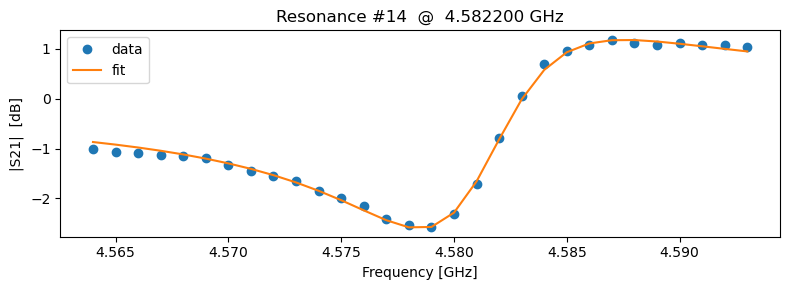

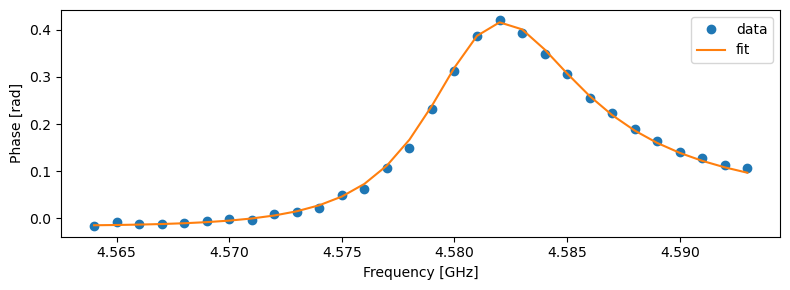

#14:  fr =  4.582200e+09 Hz   Ql = 514.8   |Qc| = 1272.4   φ0 = -1.189


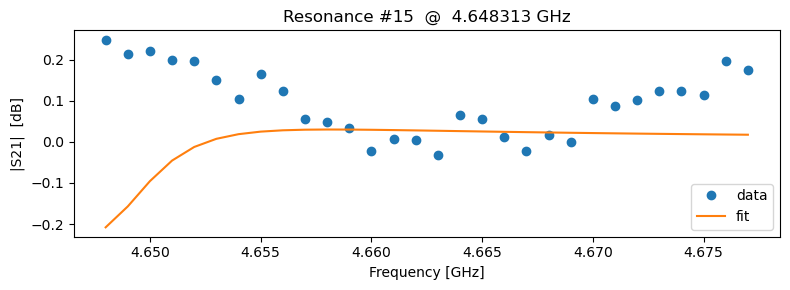

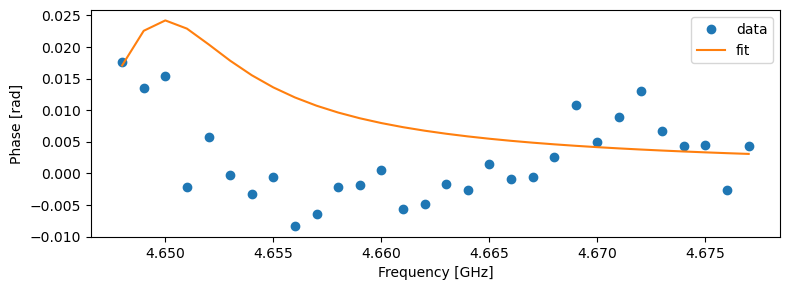

#15:  fr =  4.648313e+09 Hz   Ql = 639.8   |Qc| = 21946.1   φ0 = -0.697


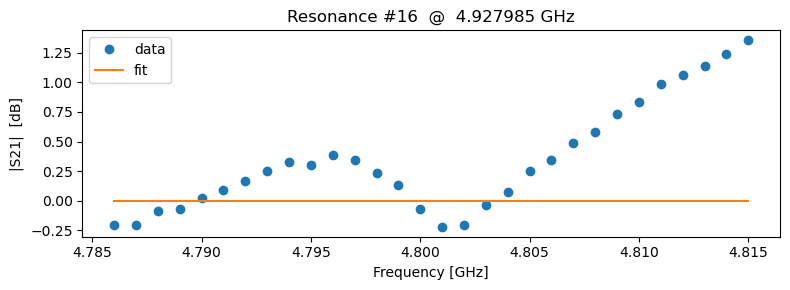

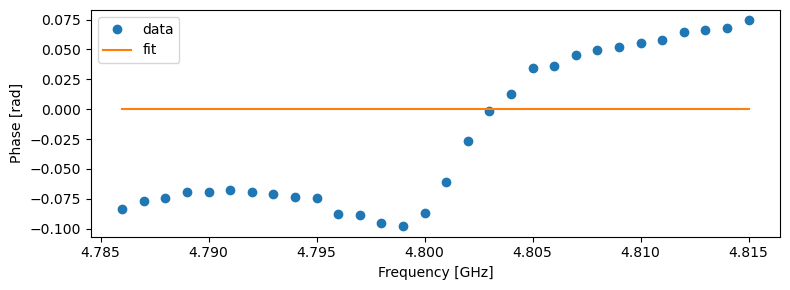

#16:  fr =  4.927985e+09 Hz   Ql = 13292061341024.4   |Qc| = 58000474466446.6   φ0 = 0.343


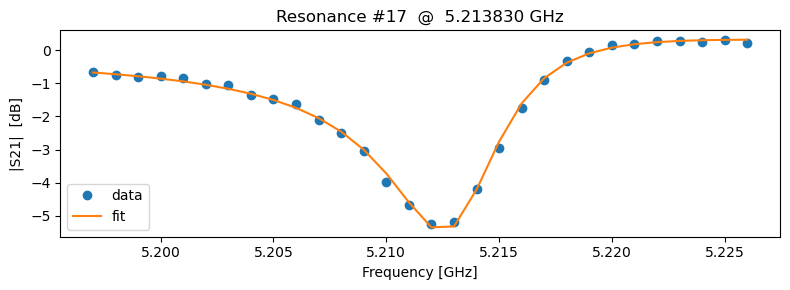

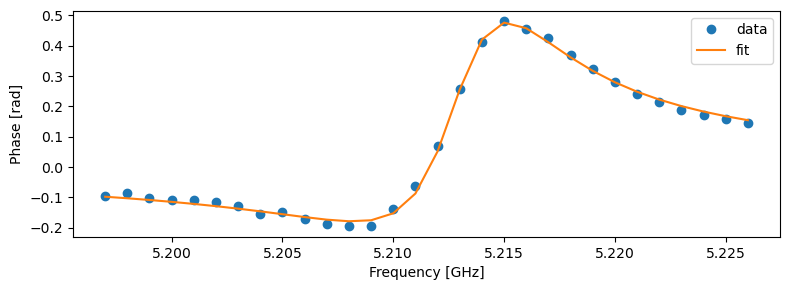

#17:  fr =  5.213830e+09 Hz   Ql = 634.2   |Qc| = 1255.3   φ0 = -0.479


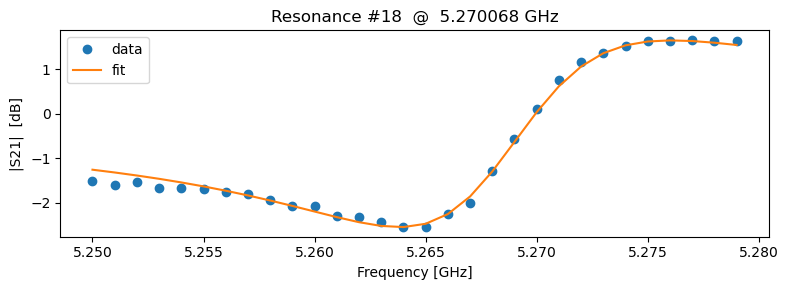

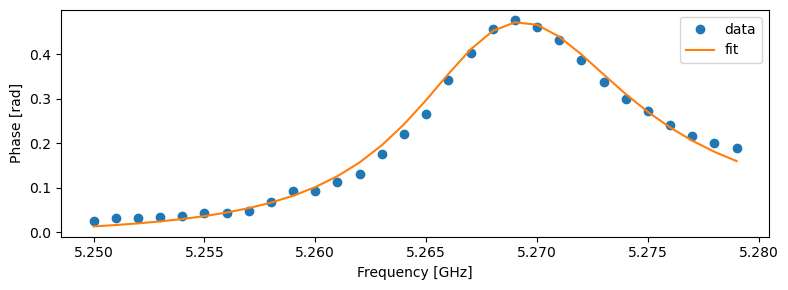

#18:  fr =  5.270068e+09 Hz   Ql = 431.1   |Qc| = 930.2   φ0 = -1.358


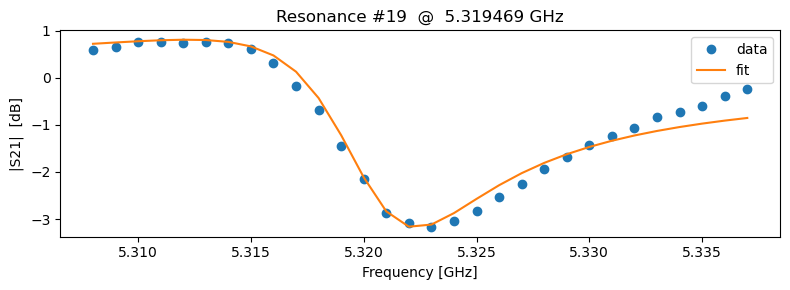

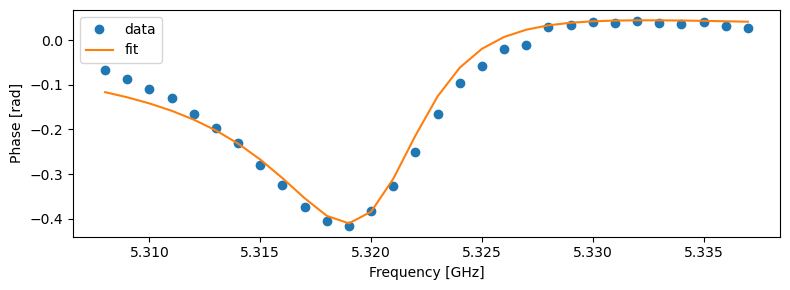

#19:  fr =  5.319469e+09 Hz   Ql = 584.4   |Qc| = 1446.4   φ0 = 0.938


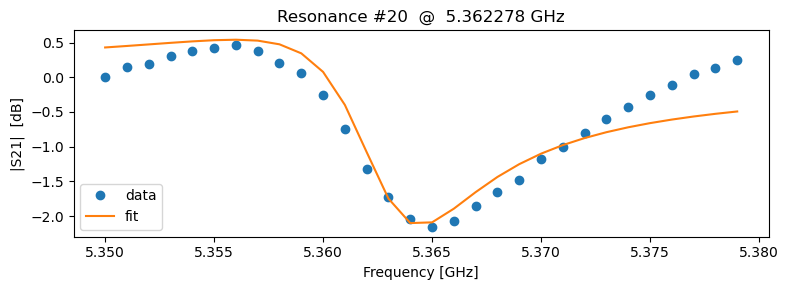

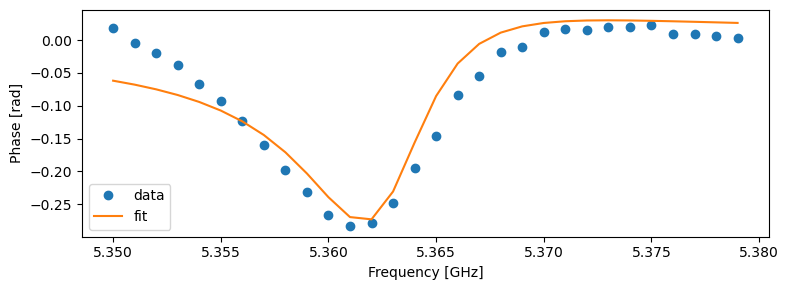

#20:  fr =  5.362278e+09 Hz   Ql = 726.7   |Qc| = 2578.8   φ0 = 0.935


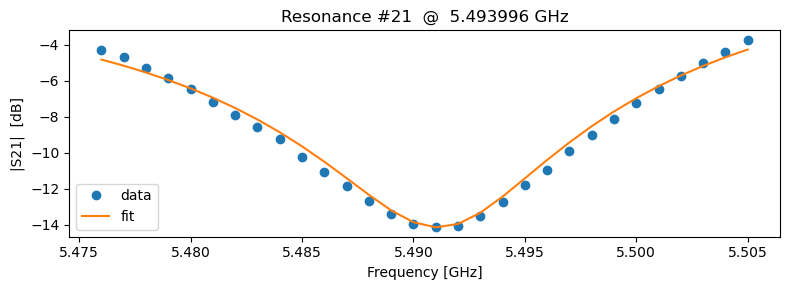

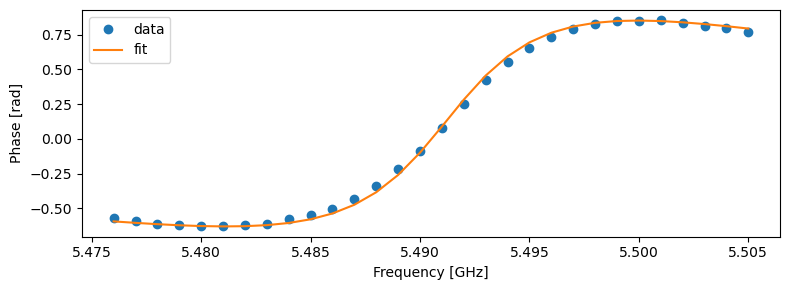

#21:  fr =  5.493996e+09 Hz   Ql = 132.2   |Qc| = 162.6   φ0 = -0.165


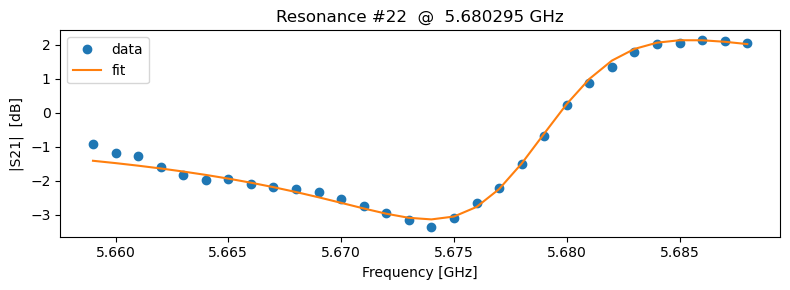

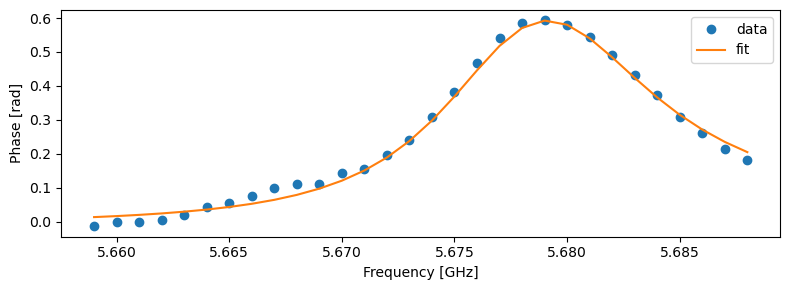

#22:  fr =  5.680295e+09 Hz   Ql = 495.6   |Qc| = 851.6   φ0 = -1.381


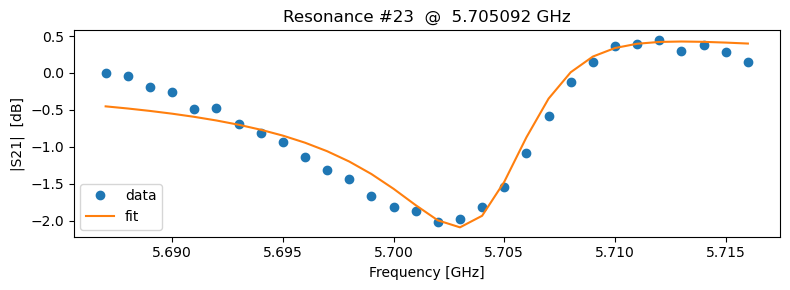

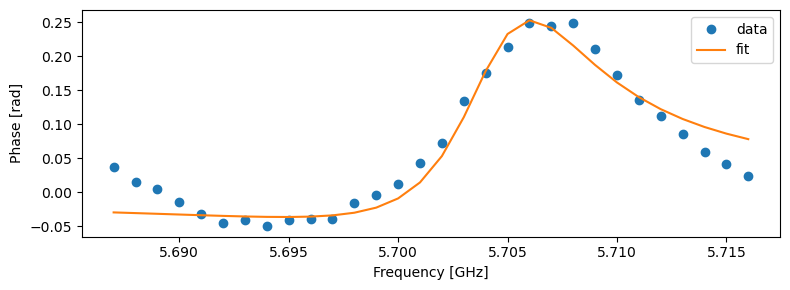

#23:  fr =  5.705092e+09 Hz   Ql = 697.8   |Qc| = 2638.7   φ0 = -0.850


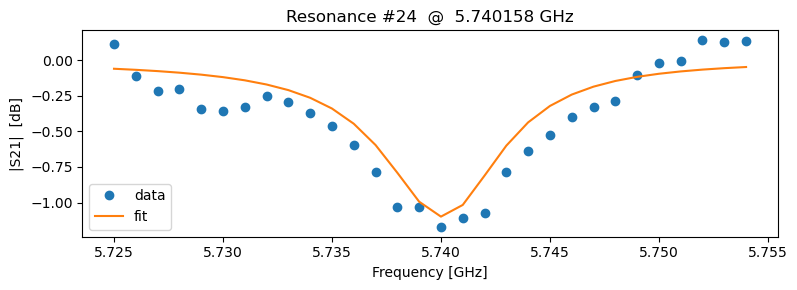

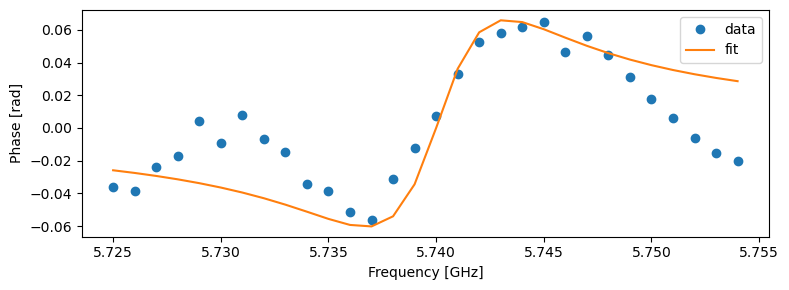

#24:  fr =  5.740158e+09 Hz   Ql = 823.2   |Qc| = 6920.1   φ0 = -0.045


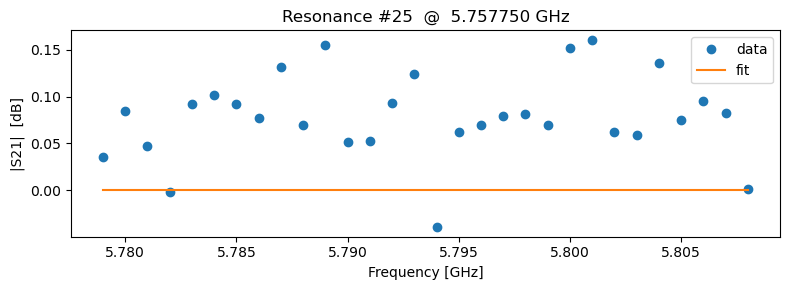

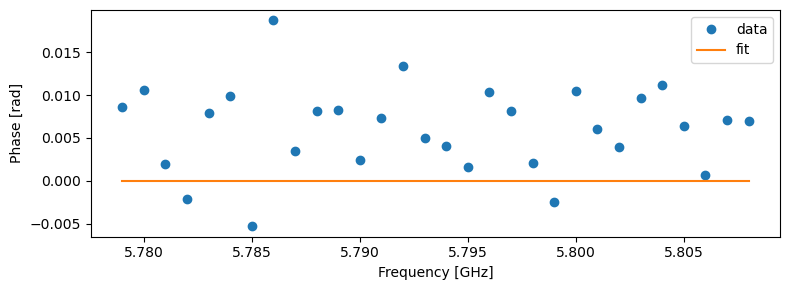

#25:  fr =  5.757750e+09 Hz   Ql = 219627123030659.3   |Qc| = 12789018139291758.0   φ0 = -0.749
Skipping resonance #26 due to fit failure: LinAlgError


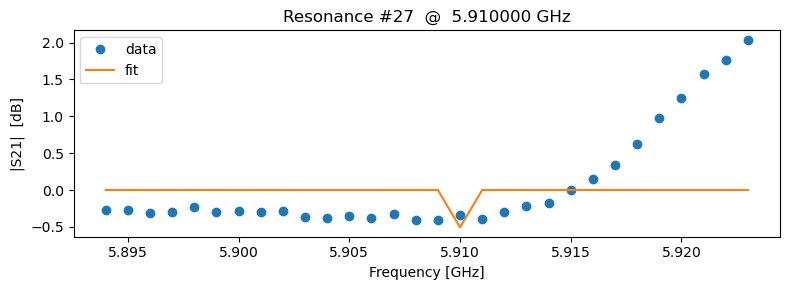

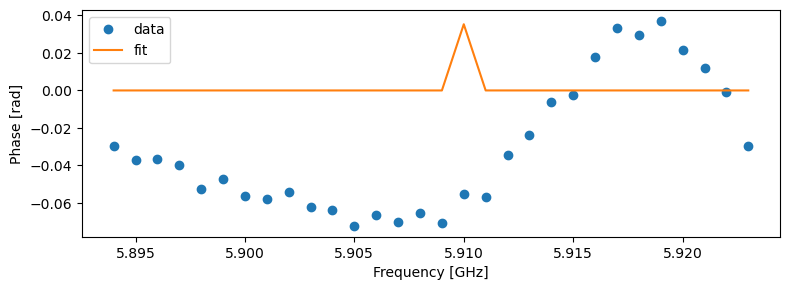

#27:  fr =  5.910000e+09 Hz   Ql = 99172960.7   |Qc| = 293336219.0   φ0 = 0.847


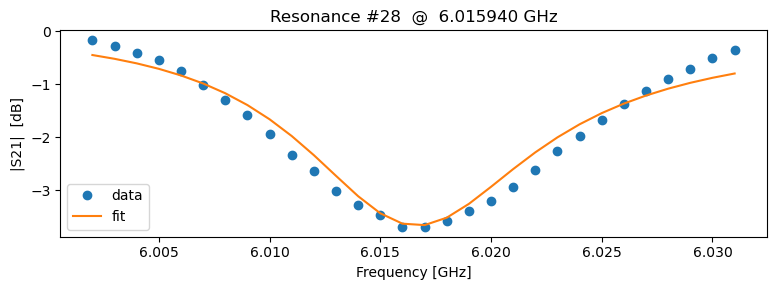

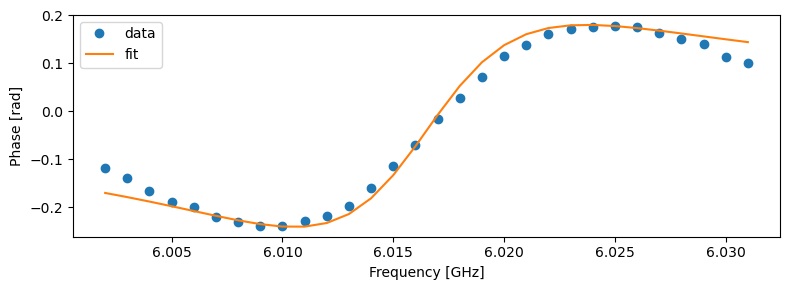

#28:  fr =  6.015940e+09 Hz   Ql = 374.7   |Qc| = 1080.2   φ0 = 0.146


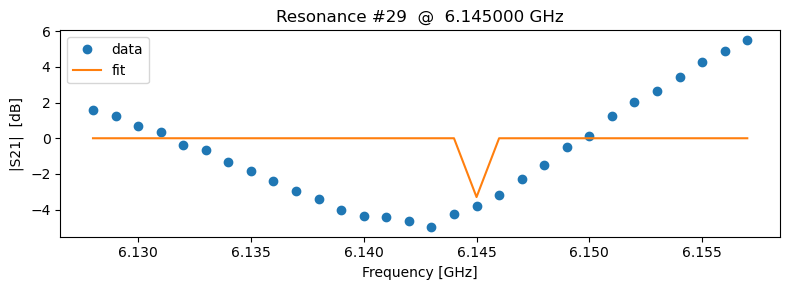

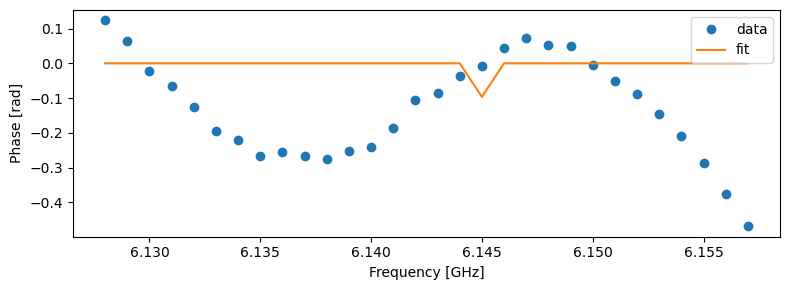

#29:  fr =  6.145000e+09 Hz   Ql = 84611419.2   |Qc| = 62578212.1   φ0 = 1.531


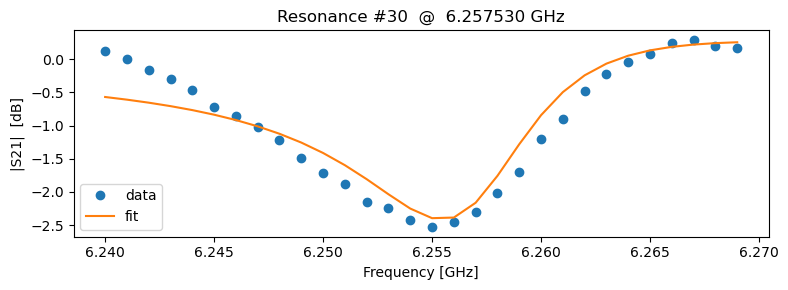

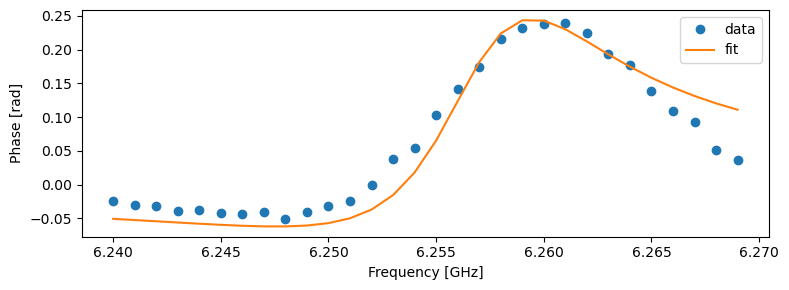

#30:  fr =  6.257530e+09 Hz   Ql = 581.0   |Qc| = 2124.0   φ0 = -0.640
Skipping resonance #31 due to fit failure: LinAlgError


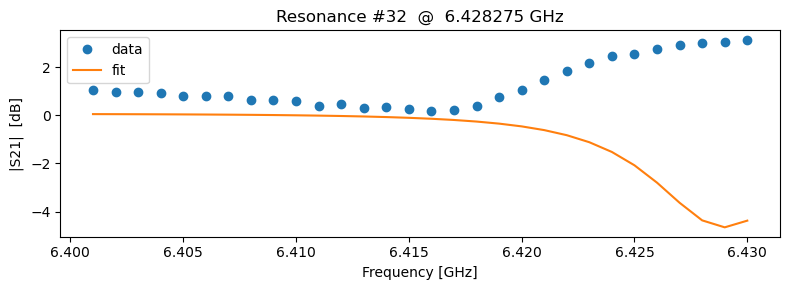

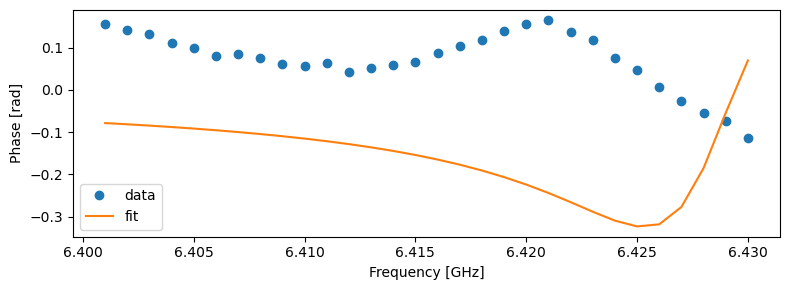

#32:  fr =  6.428275e+09 Hz   Ql = 619.0   |Qc| = 1469.9   φ0 = 0.215


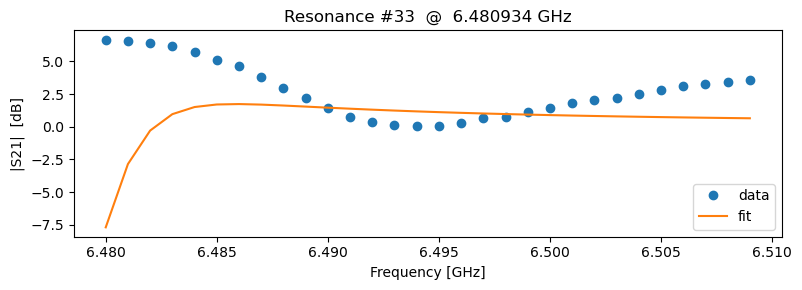

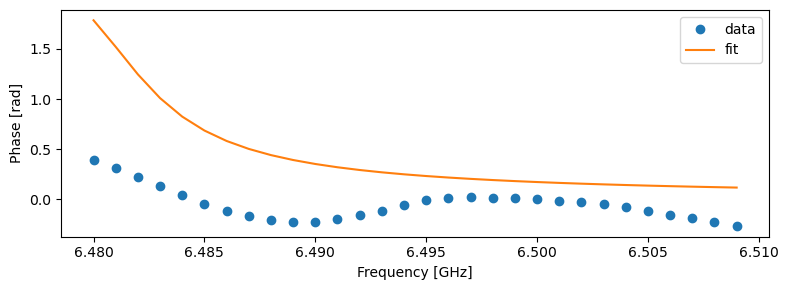

#33:  fr =  6.480934e+09 Hz   Ql = 949.0   |Qc| = 789.3   φ0 = -0.622


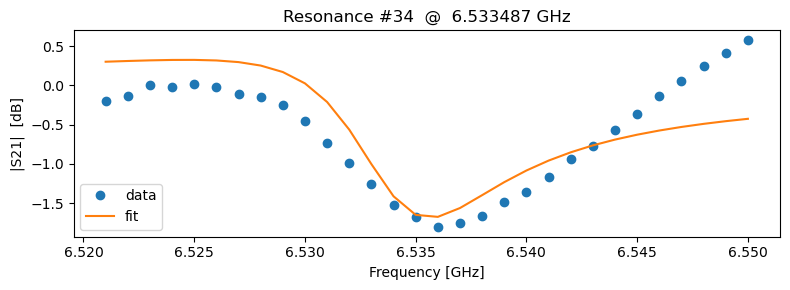

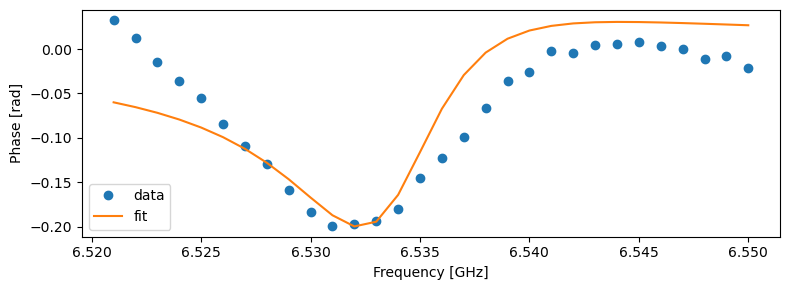

#34:  fr =  6.533487e+09 Hz   Ql = 752.4   |Qc| = 3505.2   φ0 = 0.828


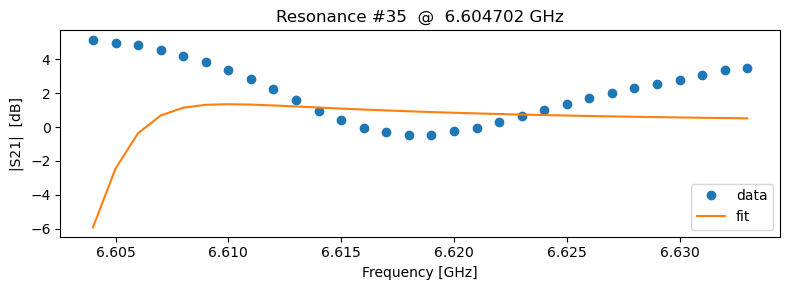

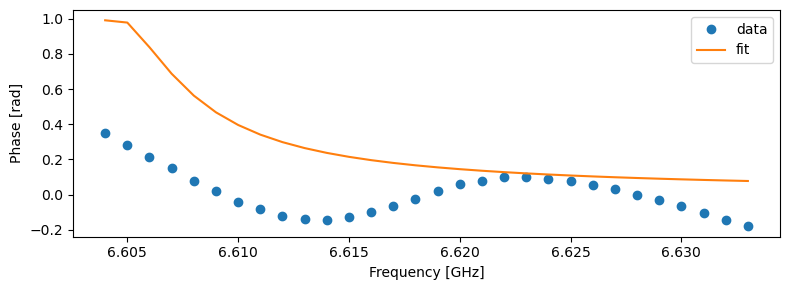

#35:  fr =  6.604702e+09 Hz   Ql = 985.2   |Qc| = 1150.8   φ0 = -0.736


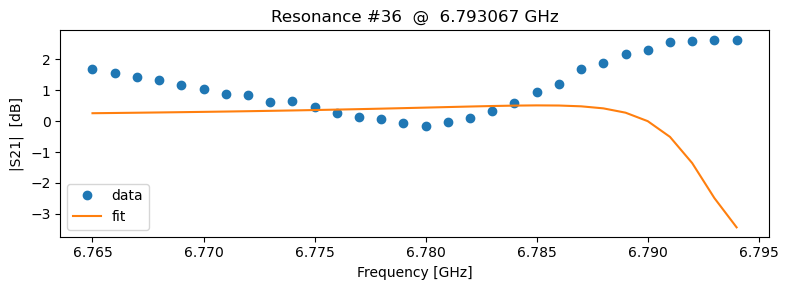

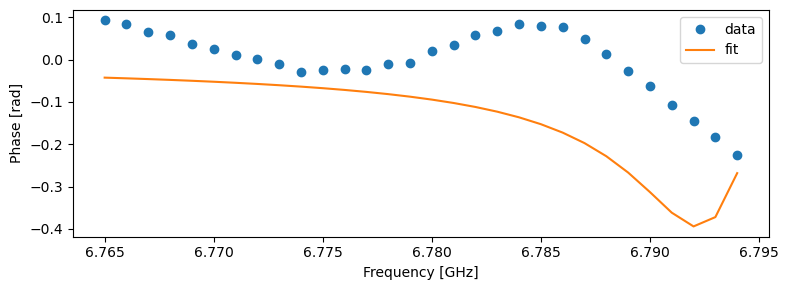

#36:  fr =  6.793067e+09 Hz   Ql = 924.4   |Qc| = 2276.0   φ0 = 0.719
Skipping resonance #37 due to fit failure: LinAlgError


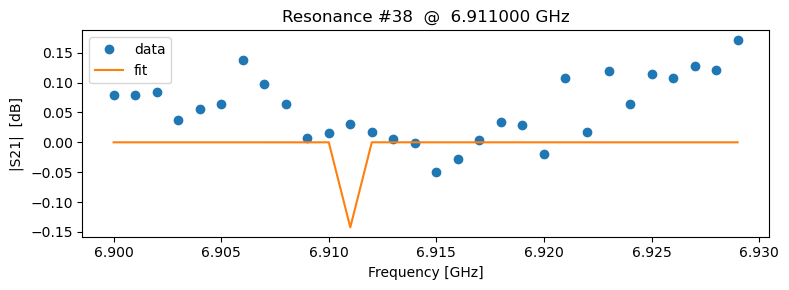

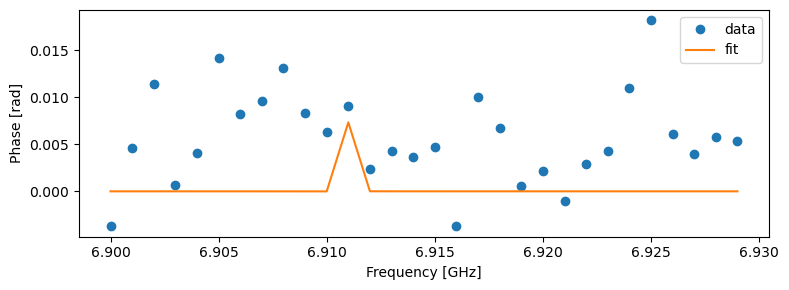

#38:  fr =  6.911000e+09 Hz   Ql = 8463377.8   |Qc| = 464410383.0   φ0 = -0.633


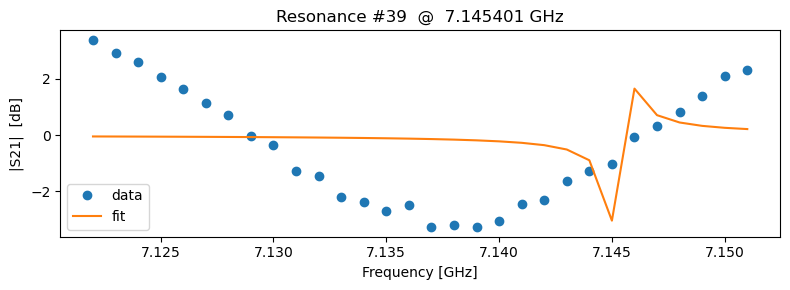

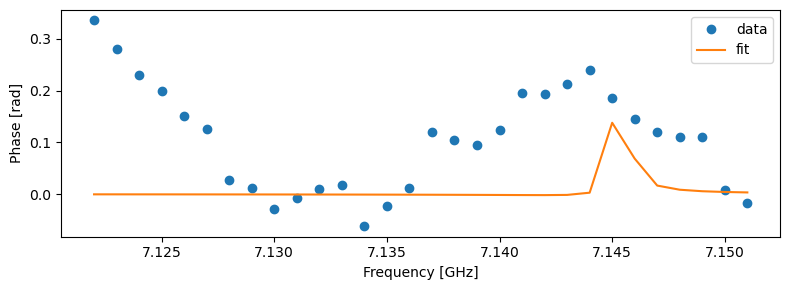

#39:  fr =  7.145401e+09 Hz   Ql = 20507.9   |Qc| = 25822.6   φ0 = -1.471


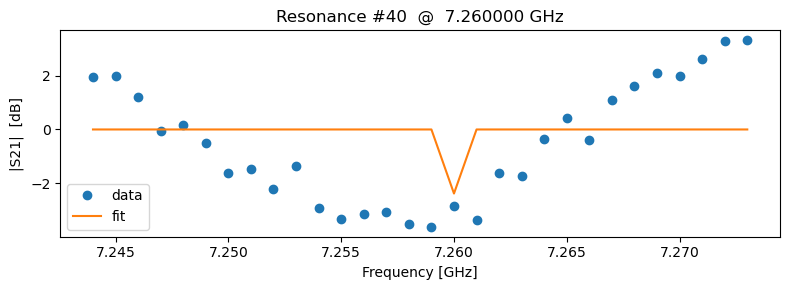

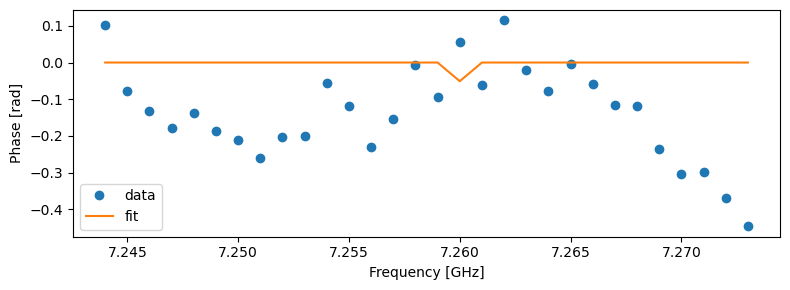

#40:  fr =  7.260000e+09 Hz   Ql = -260163819.2   |Qc| = -326323235.5   φ0 = 1.420


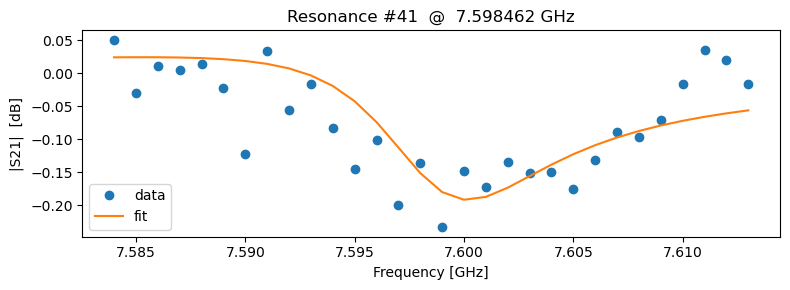

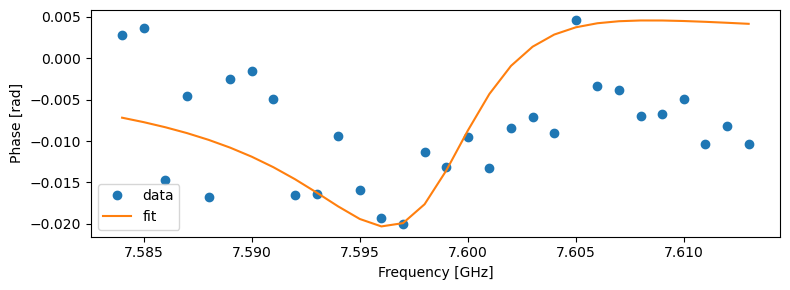

#41:  fr =  7.598462e+09 Hz   Ql = 799.5   |Qc| = 32366.6   φ0 = 0.685


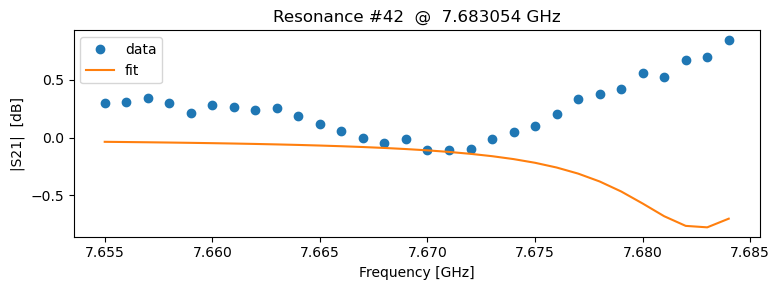

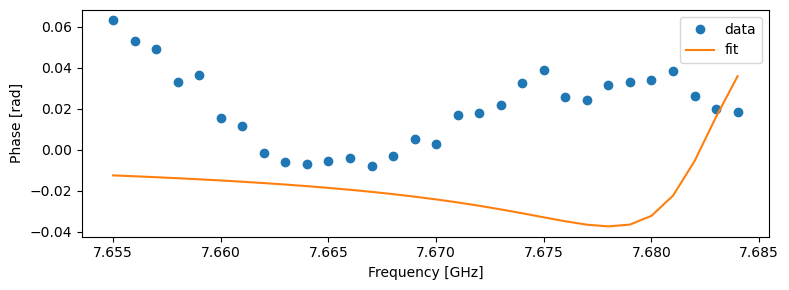

#42:  fr =  7.683054e+09 Hz   Ql = 897.0   |Qc| = 10295.7   φ0 = -0.181


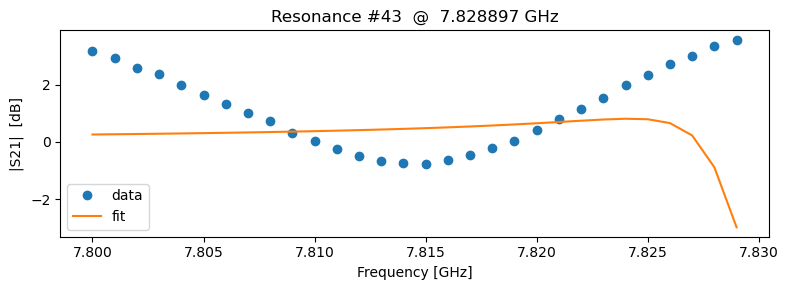

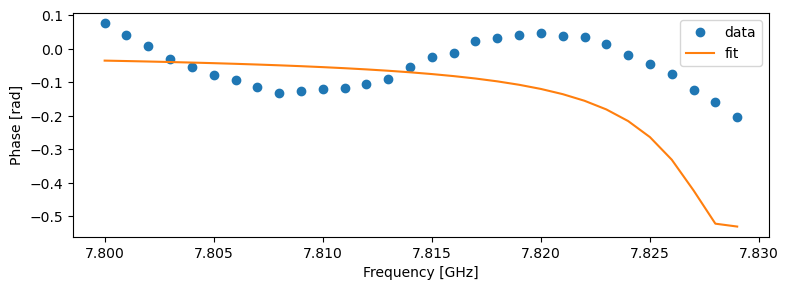

#43:  fr =  7.828897e+09 Hz   Ql = 1524.6   |Qc| = 2881.6   φ0 = 0.785


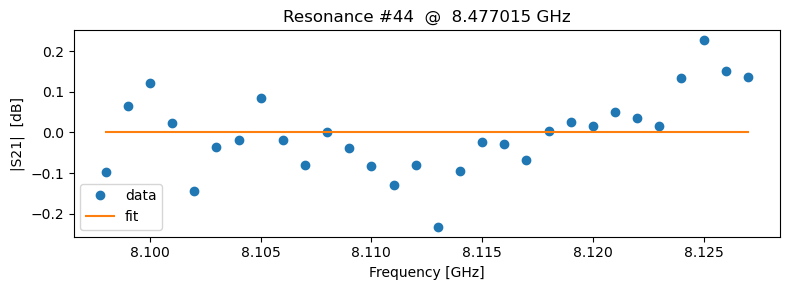

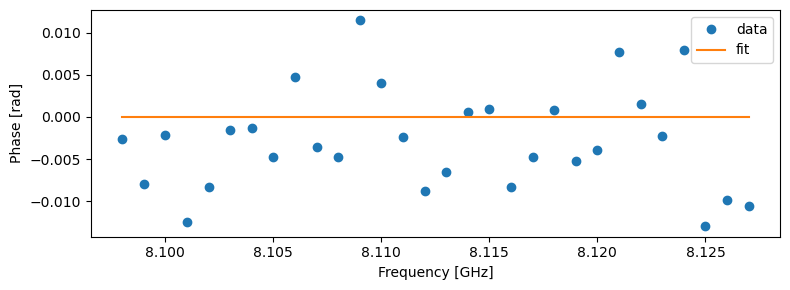

#44:  fr =  8.477015e+09 Hz   Ql = 520233717904.1   |Qc| = 8880522092658.1   φ0 = 1.287


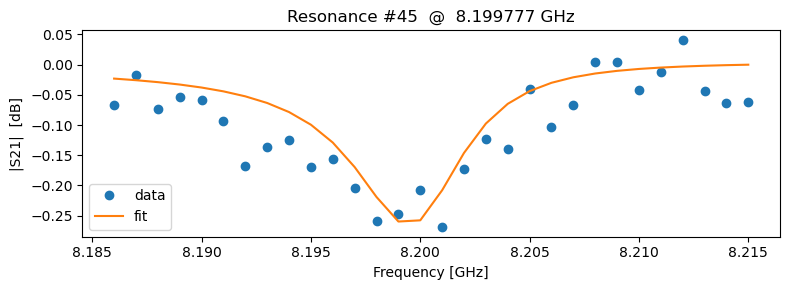

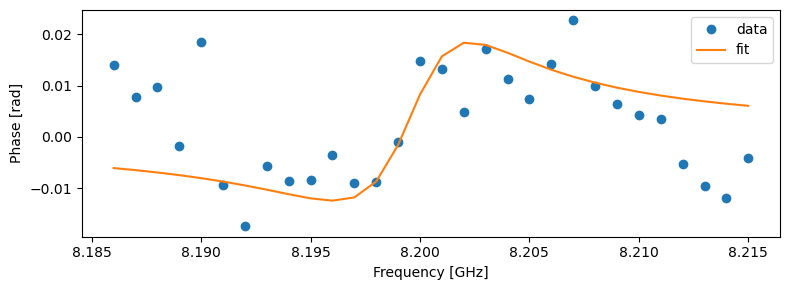

#45:  fr =  8.199777e+09 Hz   Ql = 1329.6   |Qc| = 43684.9   φ0 = -0.195


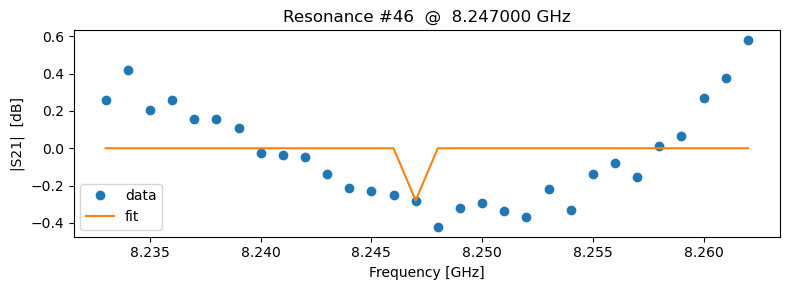

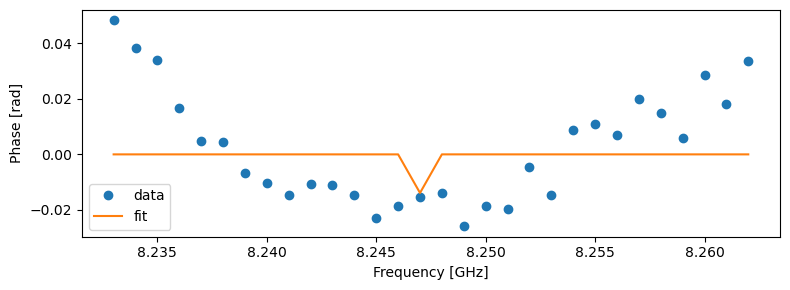

#46:  fr =  8.247000e+09 Hz   Ql = 166324070.1   |Qc| = 458709301.3   φ0 = -1.075


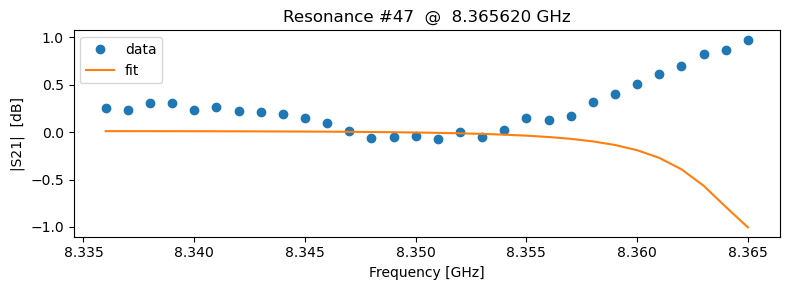

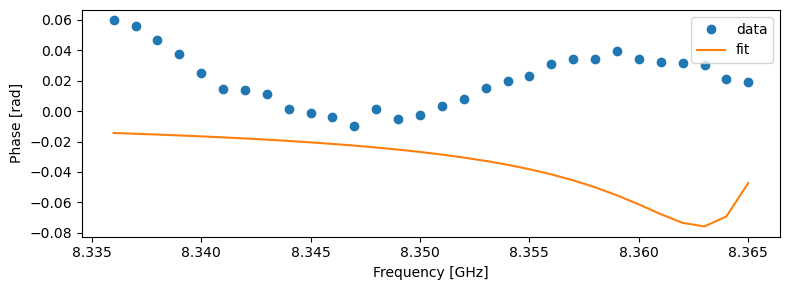

#47:  fr =  8.365620e+09 Hz   Ql = 1164.5   |Qc| = 9729.6   φ0 = 0.194


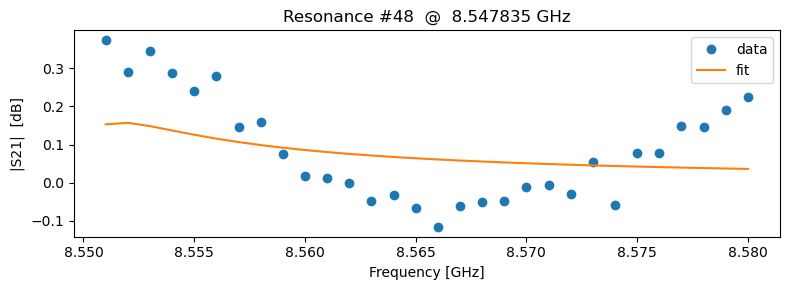

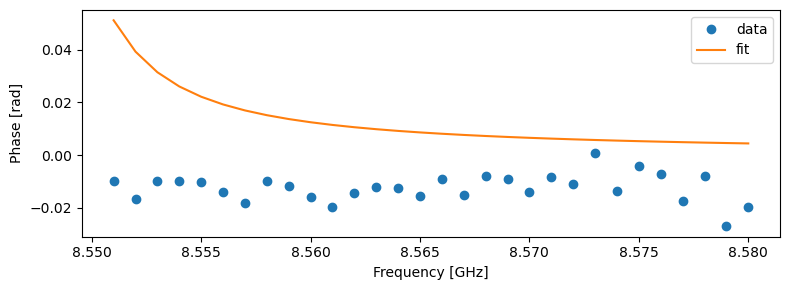

#48:  fr =  8.547835e+09 Hz   Ql = 2492.2   |Qc| = 21773.3   φ0 = -0.803
Skipping resonance #49 due to fit failure: LinAlgError


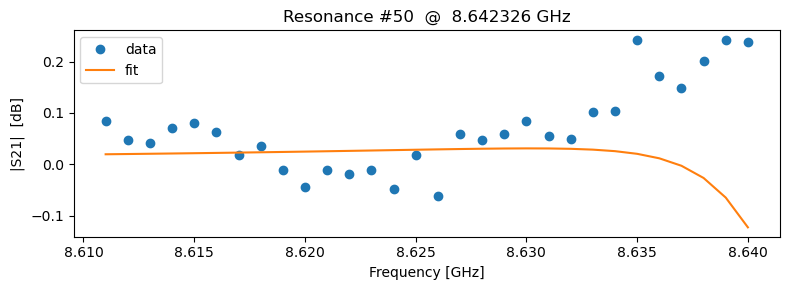

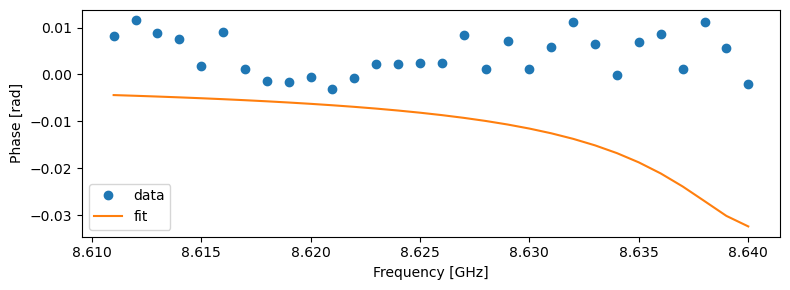

#50:  fr =  8.642326e+09 Hz   Ql = 1140.2   |Qc| = 27696.5   φ0 = 0.593


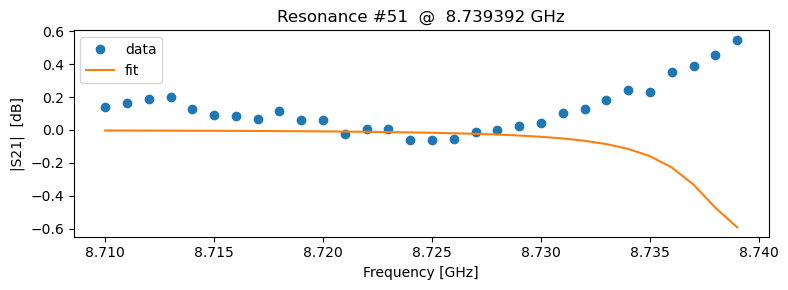

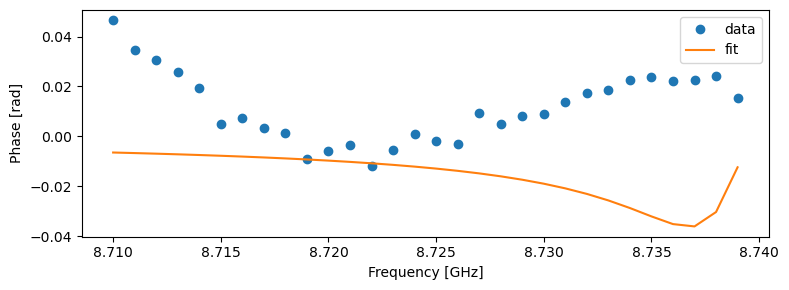

#51:  fr =  8.739392e+09 Hz   Ql = 1542.4   |Qc| = 22810.7   φ0 = 0.036


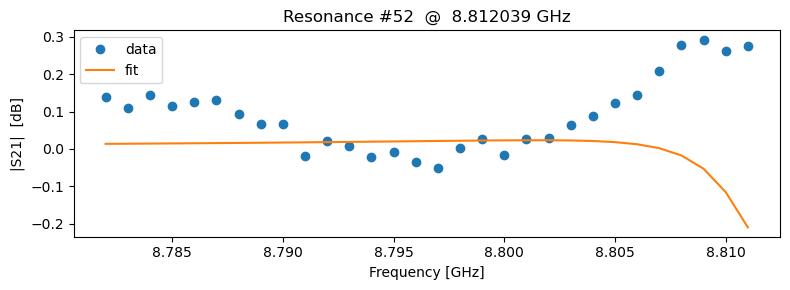

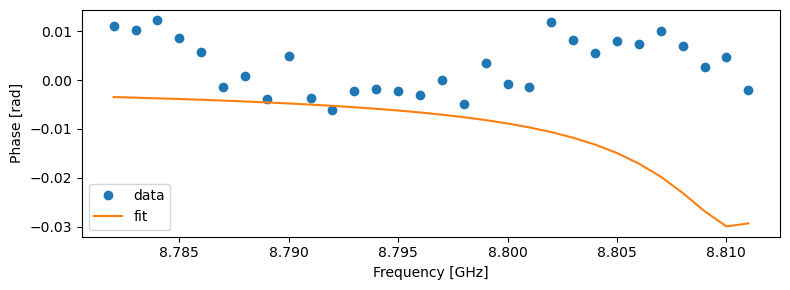

#52:  fr =  8.812039e+09 Hz   Ql = 1534.5   |Qc| = 38407.5   φ0 = 0.520


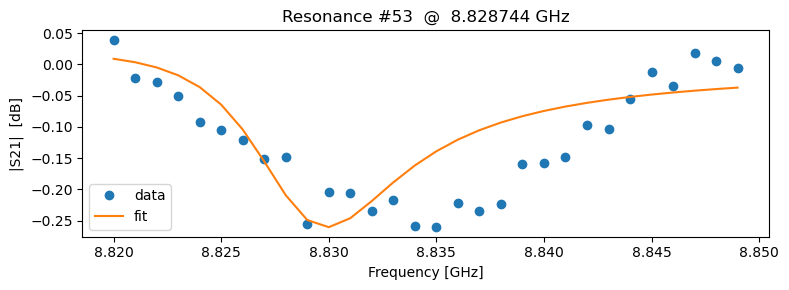

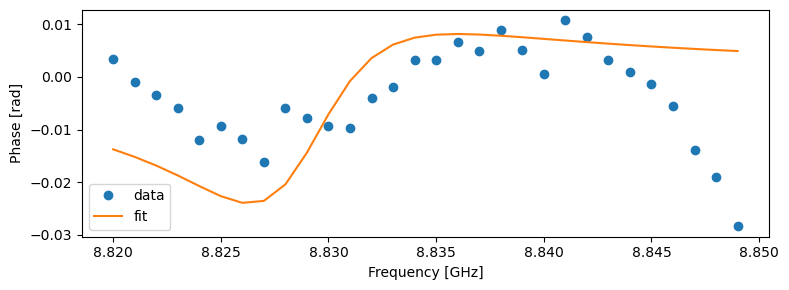

#53:  fr =  8.828744e+09 Hz   Ql = 1043.6   |Qc| = 32922.6   φ0 = 0.518


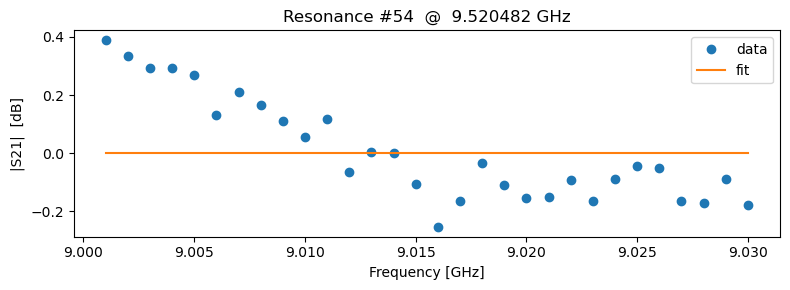

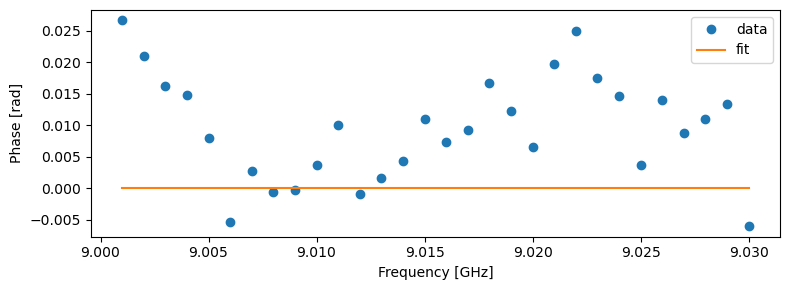

#54:  fr =  9.520482e+09 Hz   Ql = 118283539635958.5   |Qc| = 1699724548854224.8   φ0 = -1.397


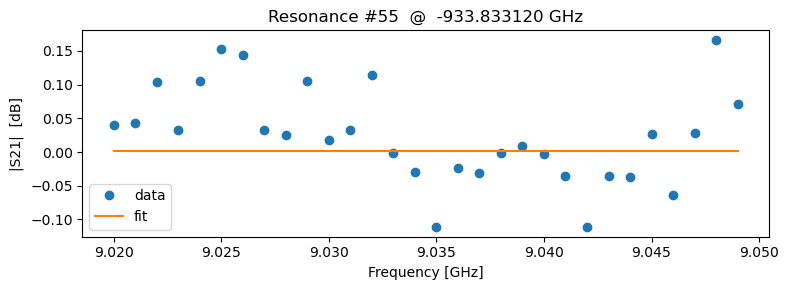

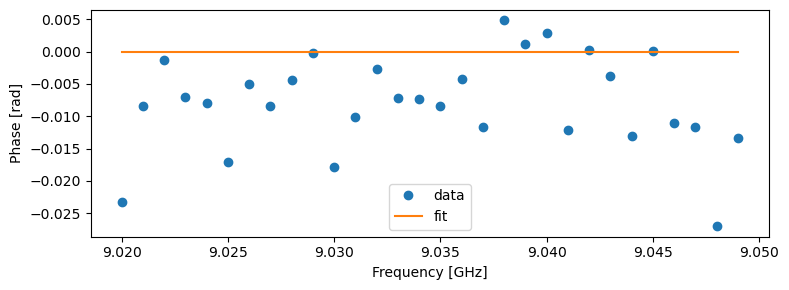

#55:  fr = -9.338331e+11 Hz   Ql = 50.9   |Qc| = 1842.4   φ0 = 1.196


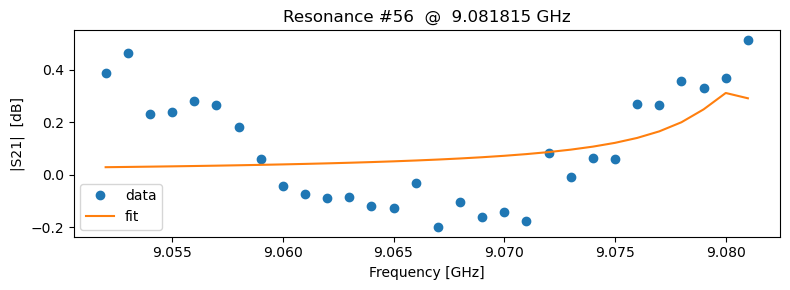

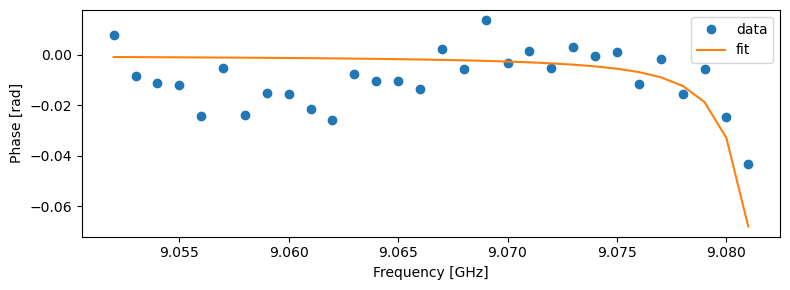

#56:  fr =  9.081815e+09 Hz   Ql = 4159.7   |Qc| = 43195.7   φ0 = 1.354


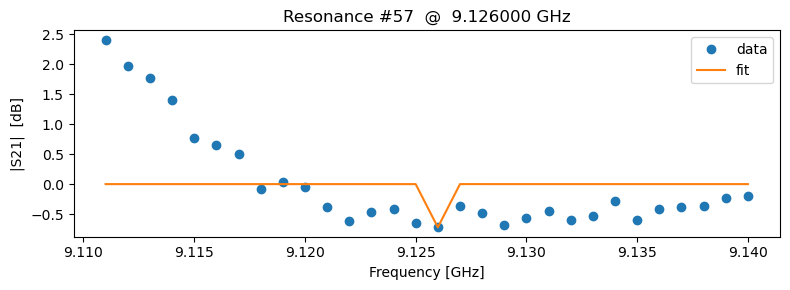

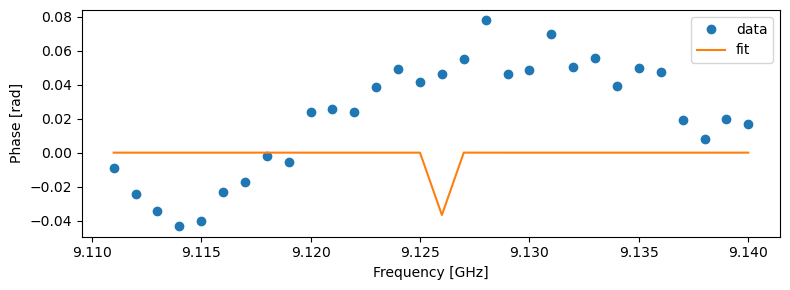

#57:  fr =  9.126000e+09 Hz   Ql = 119789190.5   |Qc| = 177706400.6   φ0 = -1.044


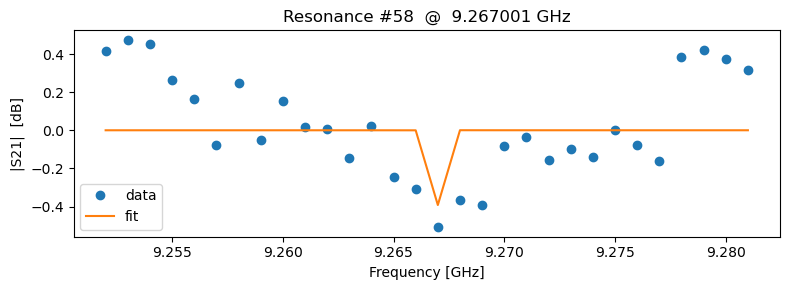

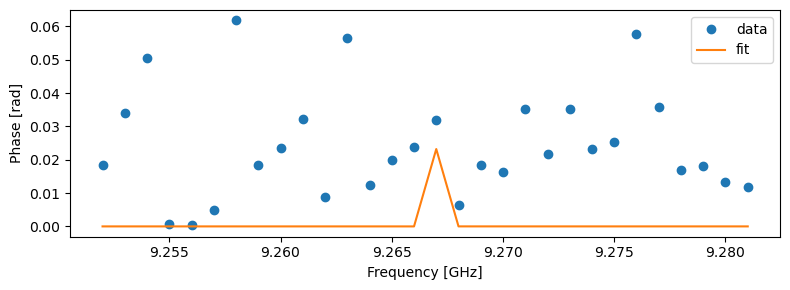

#58:  fr =  9.267001e+09 Hz   Ql = 12762915.9   |Qc| = 147552588.3   φ0 = -1.423


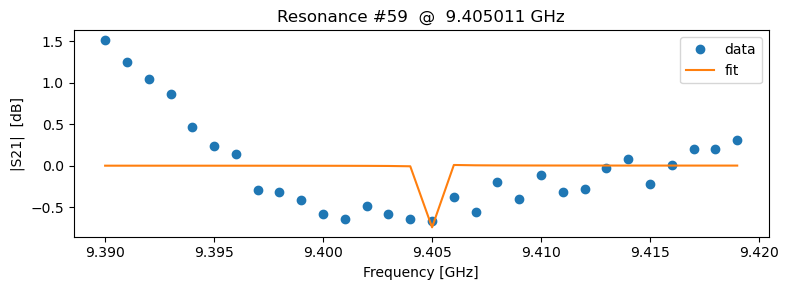

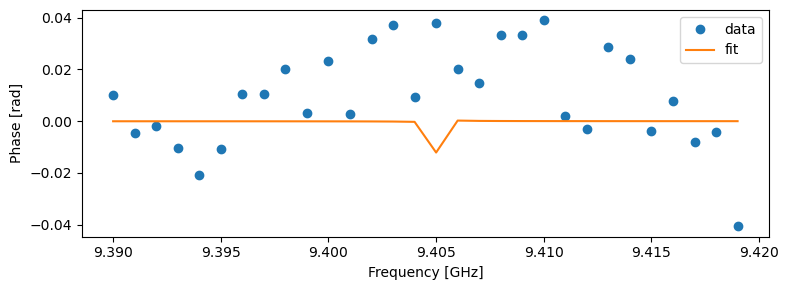

#59:  fr =  9.405011e+09 Hz   Ql = 3190046.3   |Qc| = 4991531.2   φ0 = -1.306


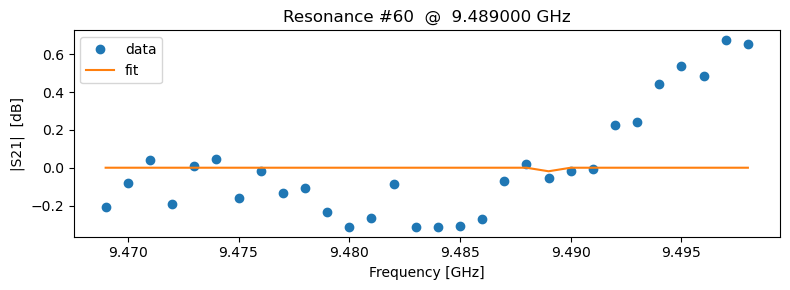

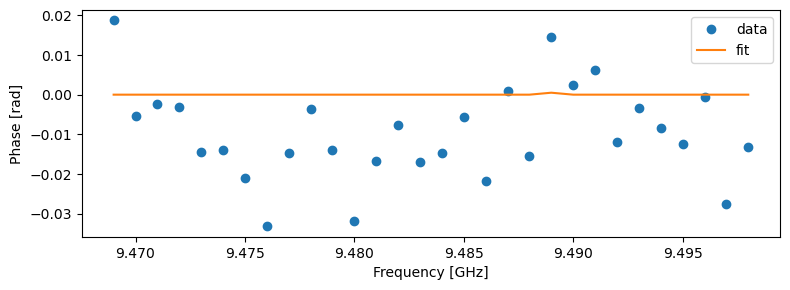

#60:  fr =  9.489000e+09 Hz   Ql = 1980004653.8   |Qc| = 12310465802.3   φ0 = 1.333


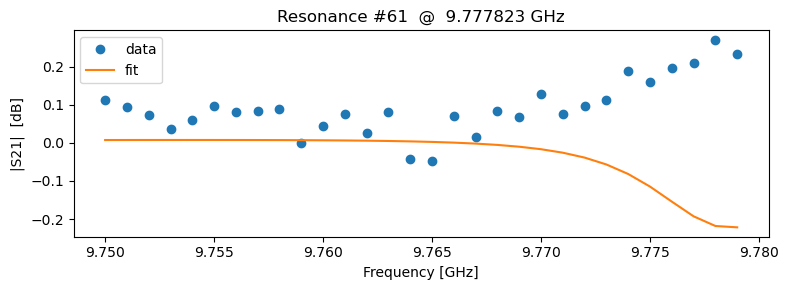

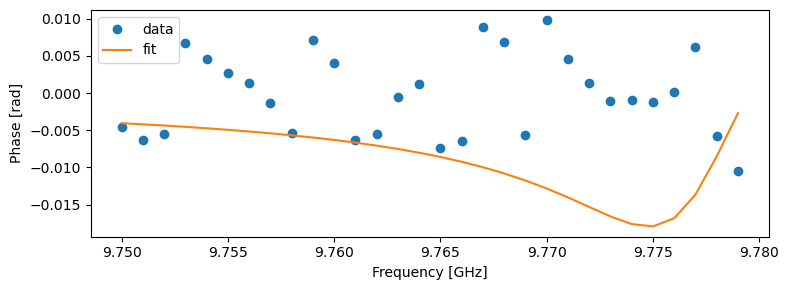

#61:  fr =  9.777823e+09 Hz   Ql = 1096.9   |Qc| = 41870.3   φ0 = 0.362


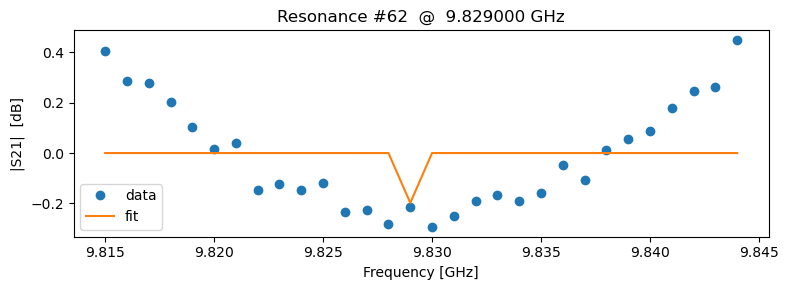

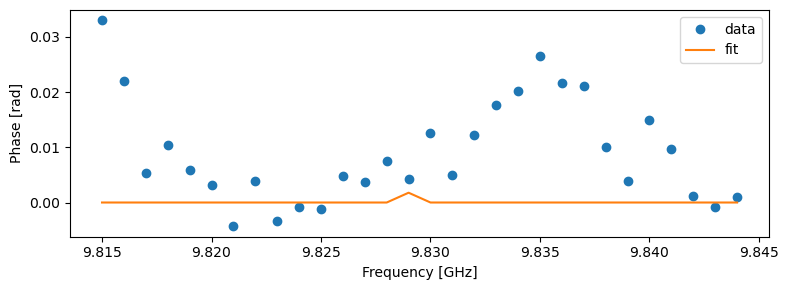

#62:  fr =  9.829000e+09 Hz   Ql = 80082746.6   |Qc| = 787320243.9   φ0 = -1.424


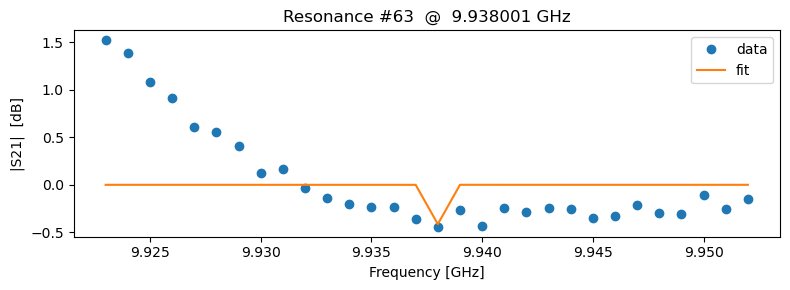

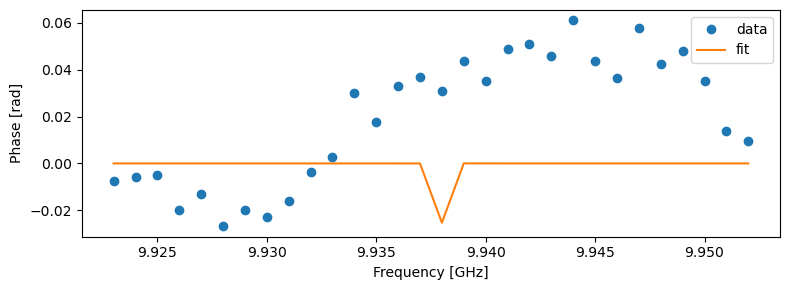

#63:  fr =  9.938001e+09 Hz   Ql = 34552261.5   |Qc| = 115954594.1   φ0 = -0.917


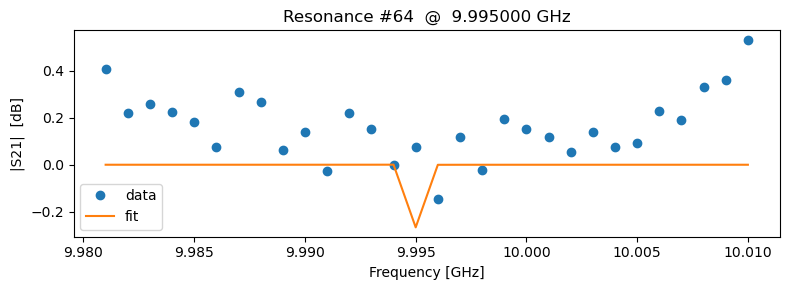

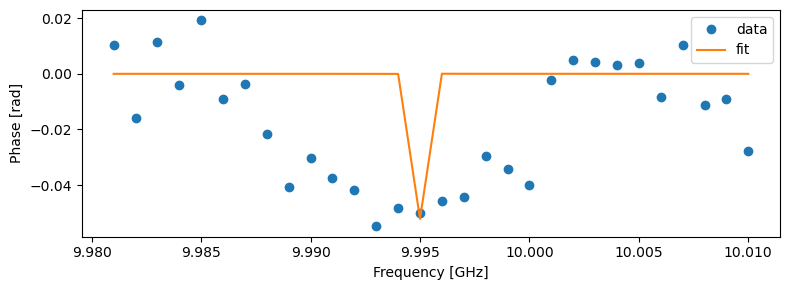

#64:  fr =  9.995000e+09 Hz   Ql = 6920865.3   |Qc| = 113144942.7   φ0 = 0.788


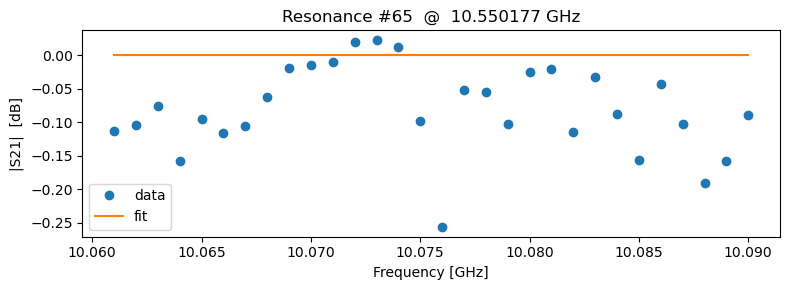

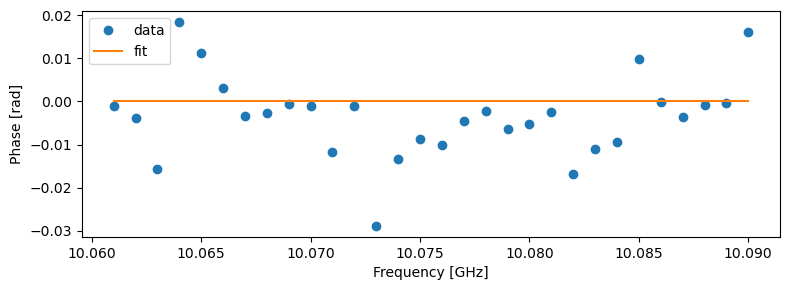

#65:  fr =  1.055018e+10 Hz   Ql = 81762068022941.2   |Qc| = 1765179116024037.0   φ0 = 0.519


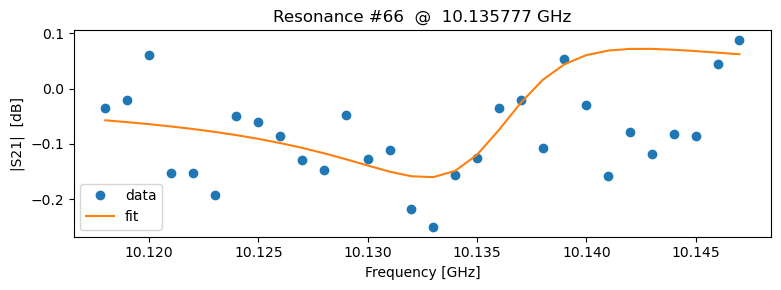

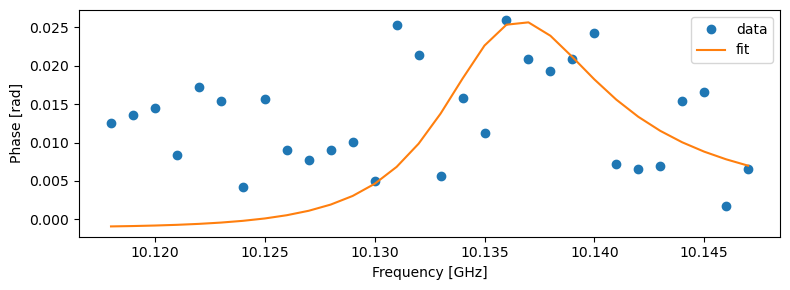

#66:  fr =  1.013578e+10 Hz   Ql = 1110.9   |Qc| = 41625.8   φ0 = -1.181


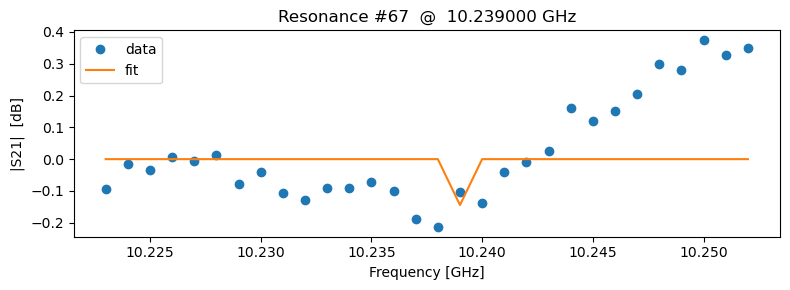

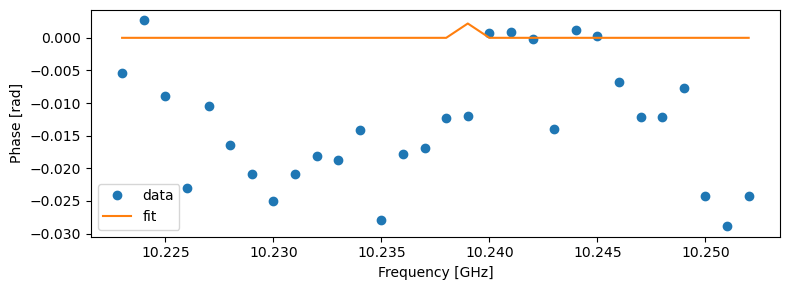

#67:  fr =  1.023900e+10 Hz   Ql = 85791543.7   |Qc| = 1591974501.4   φ0 = 1.127


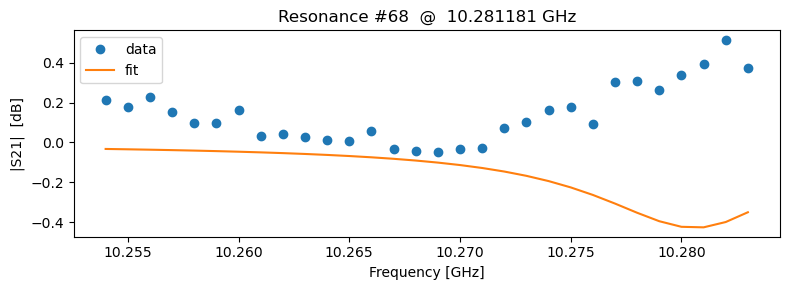

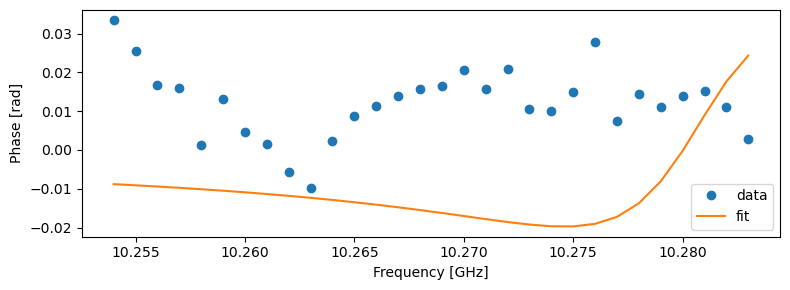

#68:  fr =  1.028118e+10 Hz   Ql = 943.7   |Qc| = 19408.0   φ0 = -0.209


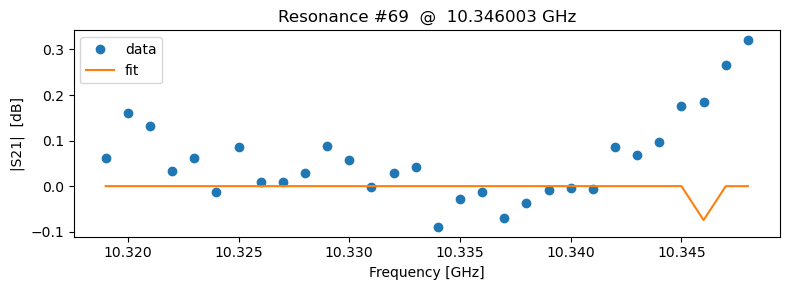

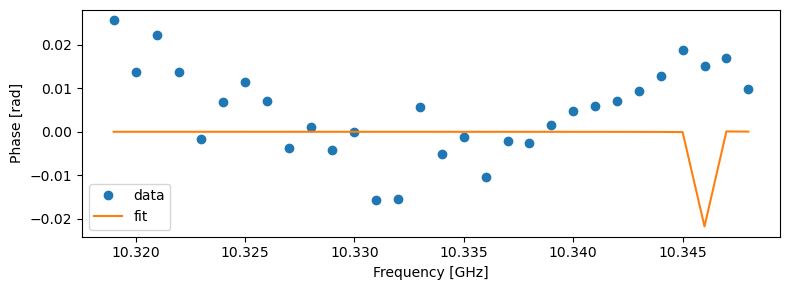

#69:  fr =  1.034600e+10 Hz   Ql = 3132370.7   |Qc| = 69117439.3   φ0 = 0.152


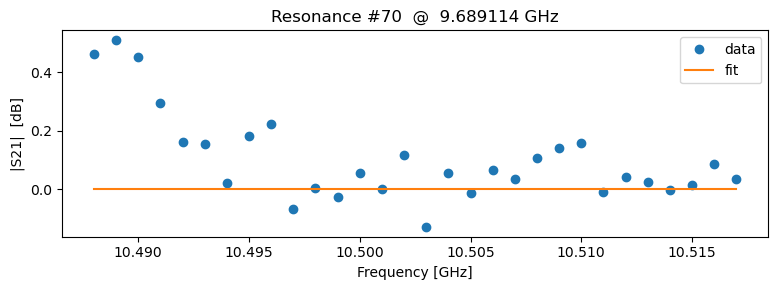

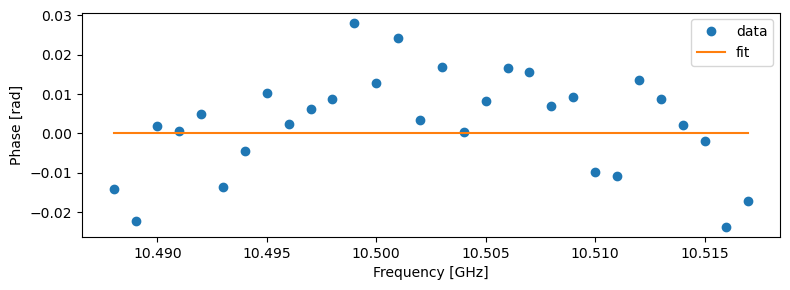

#70:  fr =  9.689114e+09 Hz   Ql = 49958337319363.3   |Qc| = 789329328362153.5   φ0 = -0.230


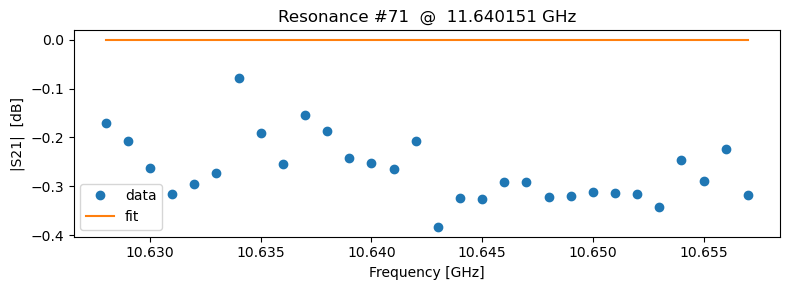

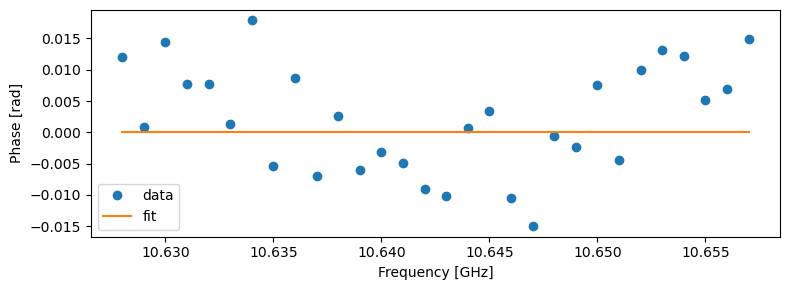

#71:  fr =  1.164015e+10 Hz   Ql = 81604241995396.4   |Qc| = 2853042318945474.5   φ0 = -0.168


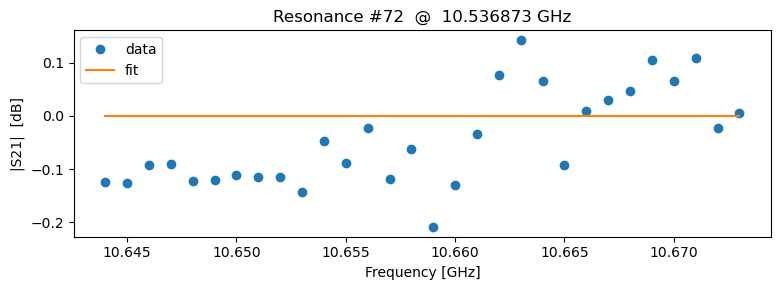

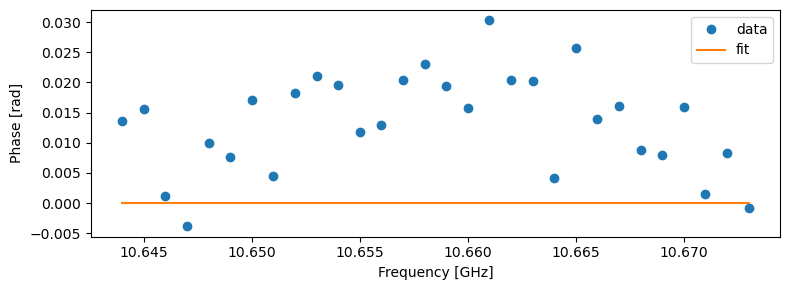

#72:  fr =  1.053687e+10 Hz   Ql = 1050962267060939.5   |Qc| = 36051161452934304.0   φ0 = -1.099


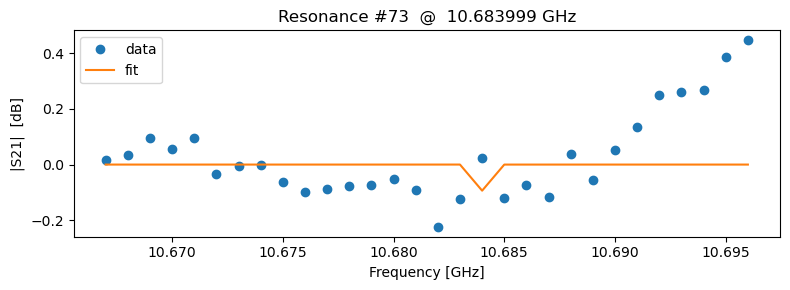

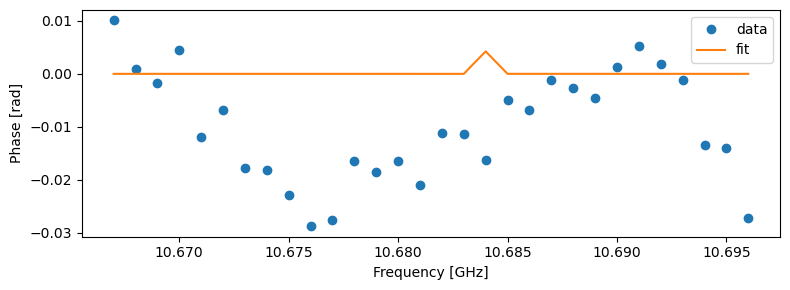

#73:  fr =  1.068400e+10 Hz   Ql = 47351349.3   |Qc| = 770971113.6   φ0 = 1.009


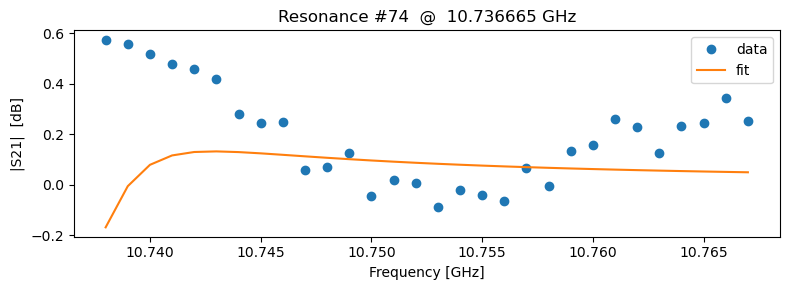

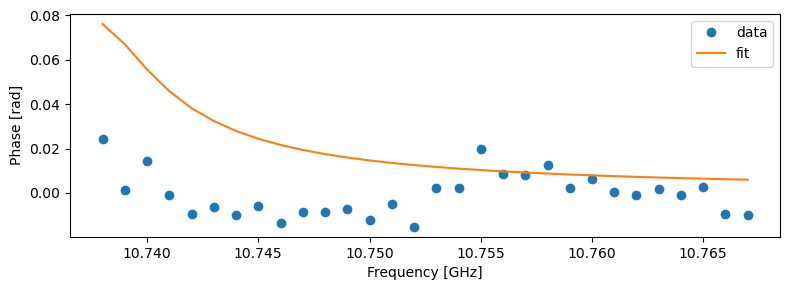

#74:  fr =  1.073666e+10 Hz   Ql = 1817.0   |Qc| = 21277.9   φ0 = -0.859


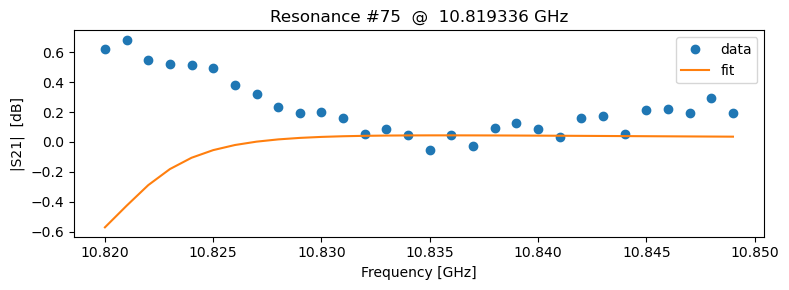

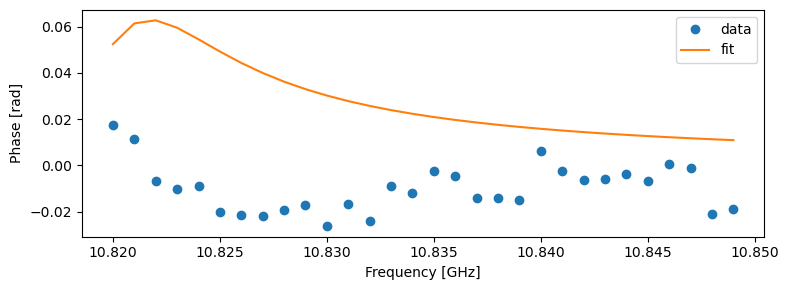

#75:  fr =  1.081934e+10 Hz   Ql = 1273.0   |Qc| = 15444.1   φ0 = -0.492


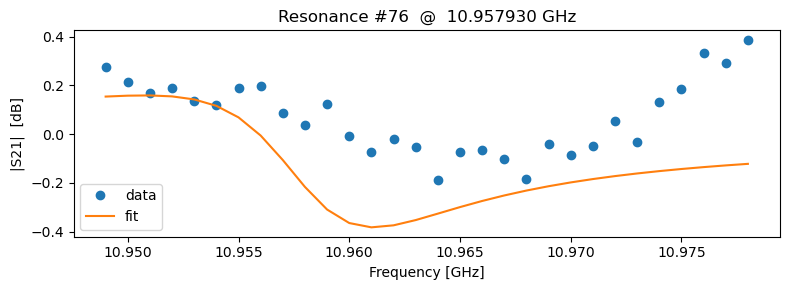

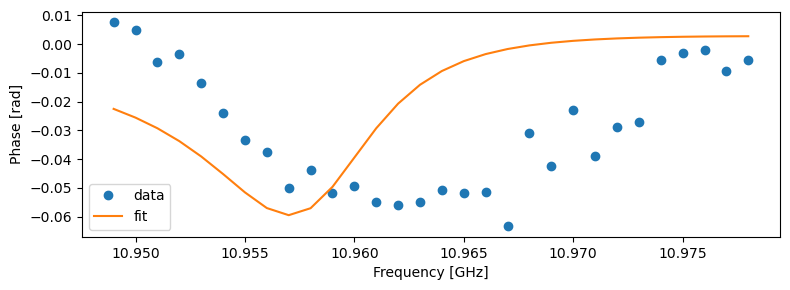

#76:  fr =  1.095793e+10 Hz   Ql = 1151.5   |Qc| = 18722.6   φ0 = 1.145


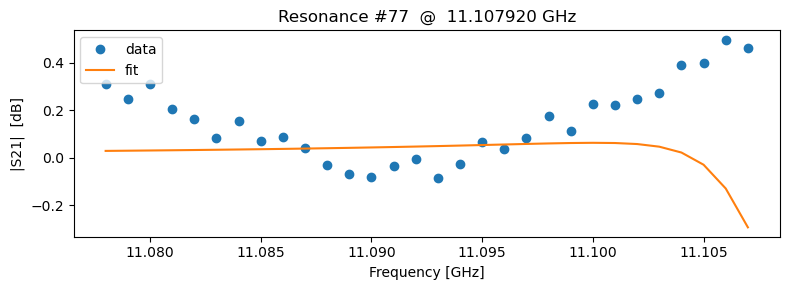

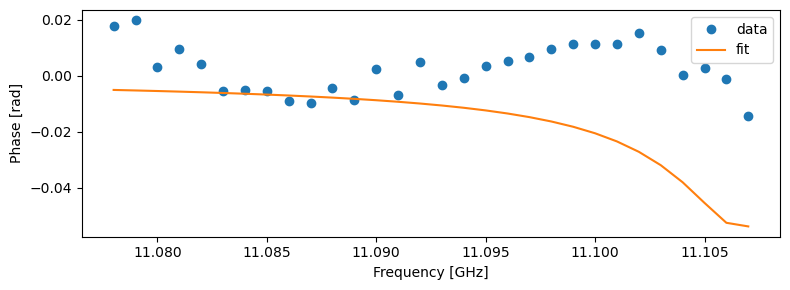

#77:  fr =  1.110792e+10 Hz   Ql = 1982.2   |Qc| = 30165.8   φ0 = 0.668


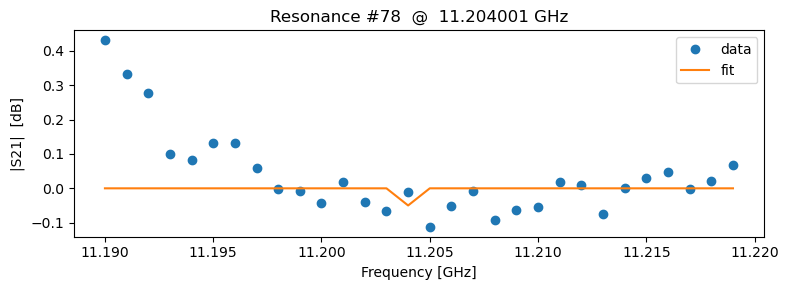

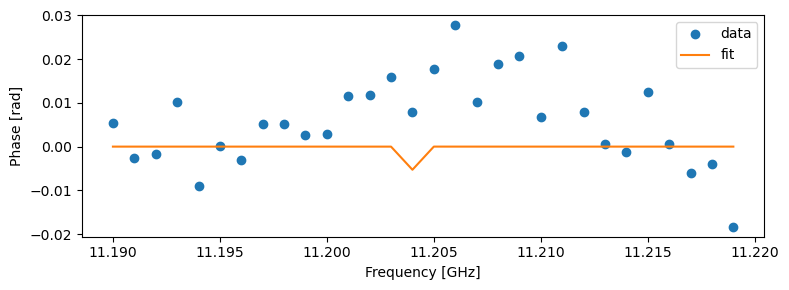

#78:  fr =  1.120400e+10 Hz   Ql = 80396295.2   |Qc| = 1403050172.5   φ0 = -0.693


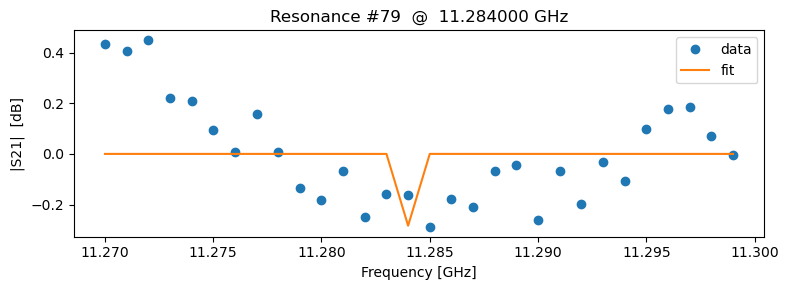

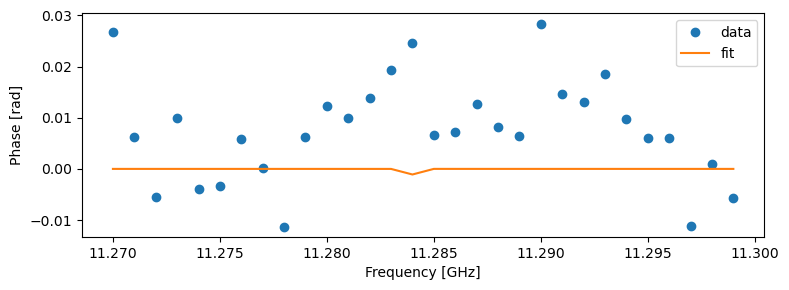

#79:  fr =  1.128400e+10 Hz   Ql = 63168834.8   |Qc| = 586265365.0   φ0 = -1.235


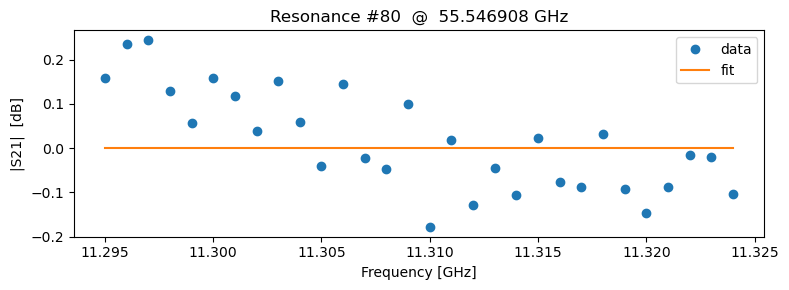

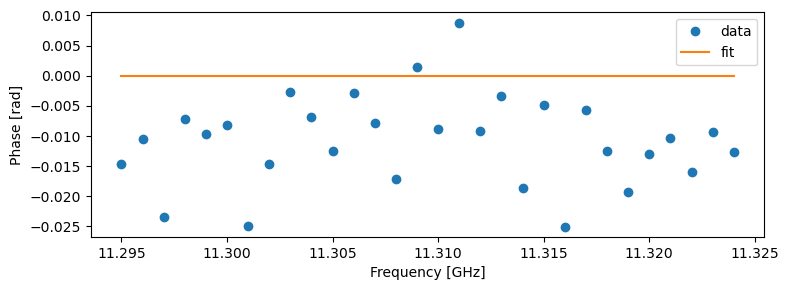

#80:  fr =  5.554691e+10 Hz   Ql = 310586684874020.6   |Qc| = 8545050728583984.0   φ0 = 1.164


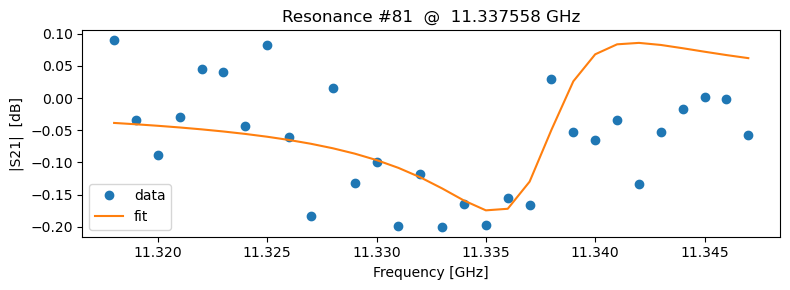

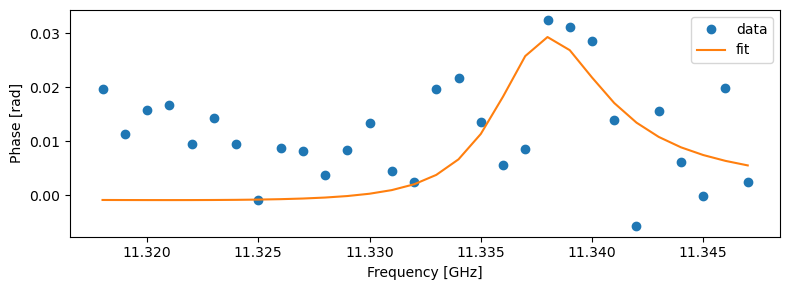

#81:  fr =  1.133756e+10 Hz   Ql = 1904.2   |Qc| = 63276.1   φ0 = -1.218


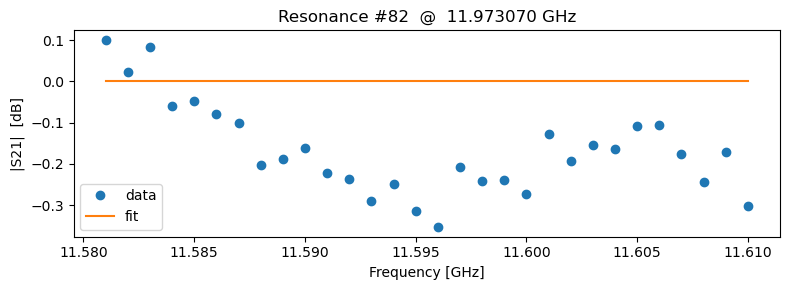

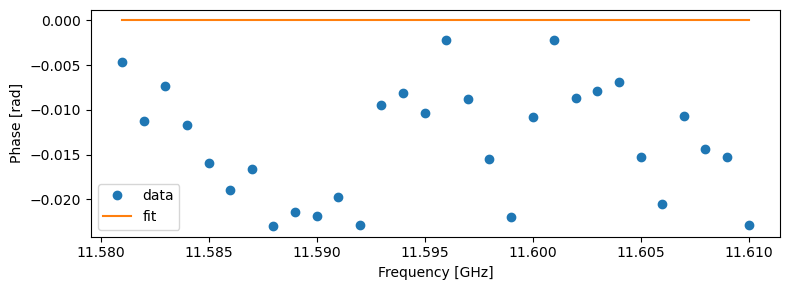

#82:  fr =  1.197307e+10 Hz   Ql = 199769922308771.2   |Qc| = 3887701758939719.5   φ0 = -0.267


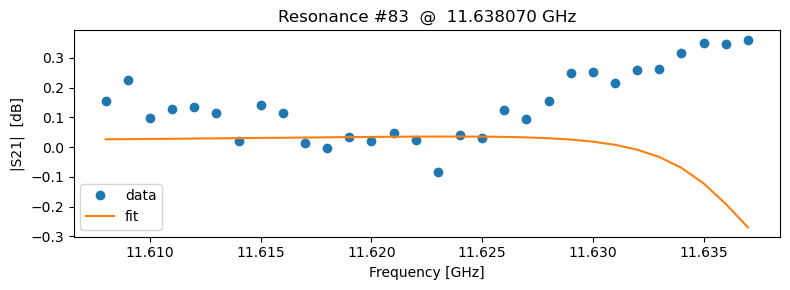

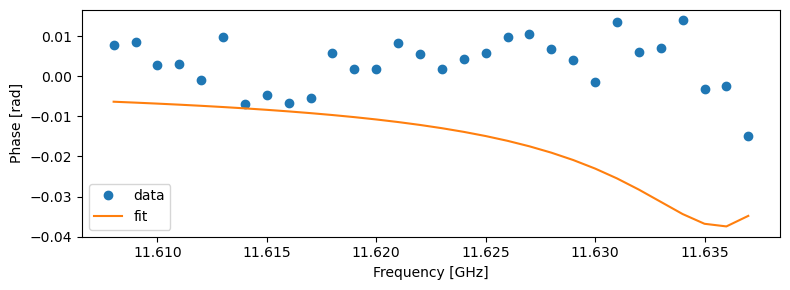

#83:  fr =  1.163807e+10 Hz   Ql = 1282.0   |Qc| = 27162.6   φ0 = 0.594


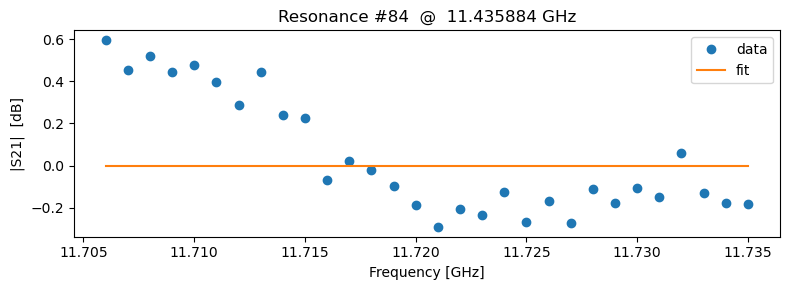

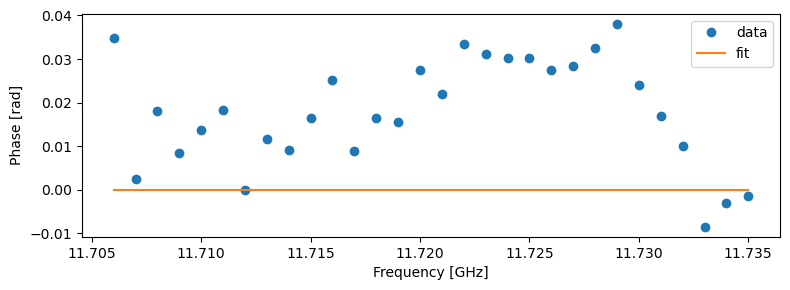

#84:  fr =  1.143588e+10 Hz   Ql = 1322857988366.2   |Qc| = 14175881314178.4   φ0 = -1.156


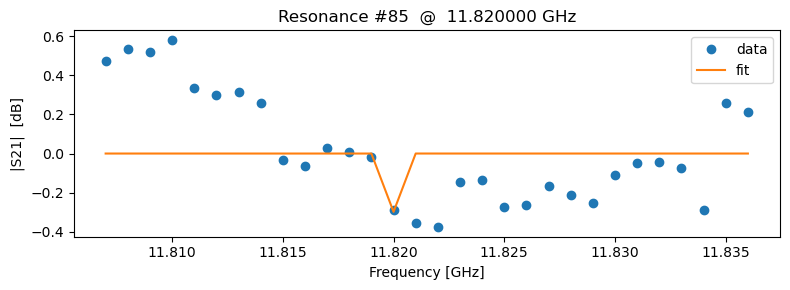

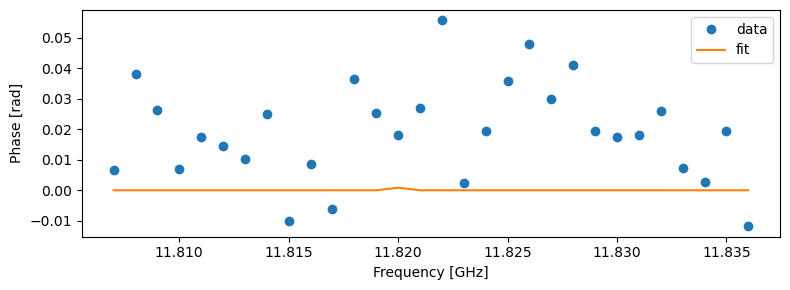

#85:  fr =  1.182000e+10 Hz   Ql = 89082312.3   |Qc| = 871735232.4   φ0 = -1.259


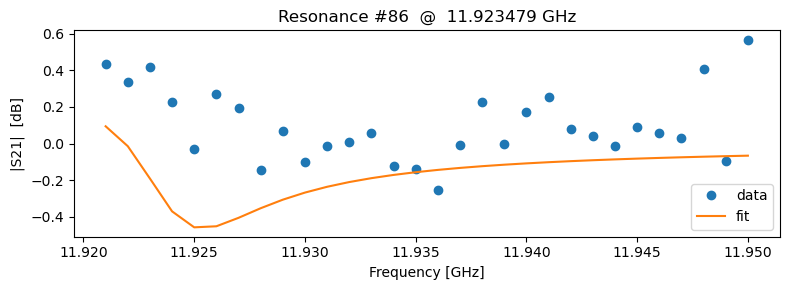

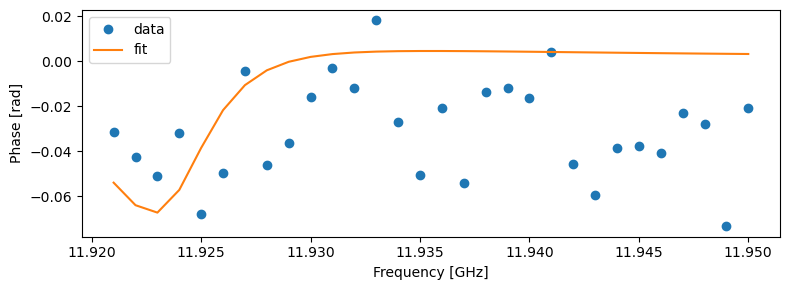

#86:  fr =  1.192348e+10 Hz   Ql = 1920.6   |Qc| = 27102.8   φ0 = 1.068


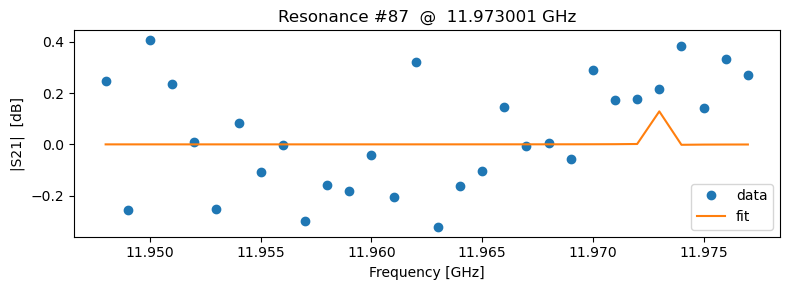

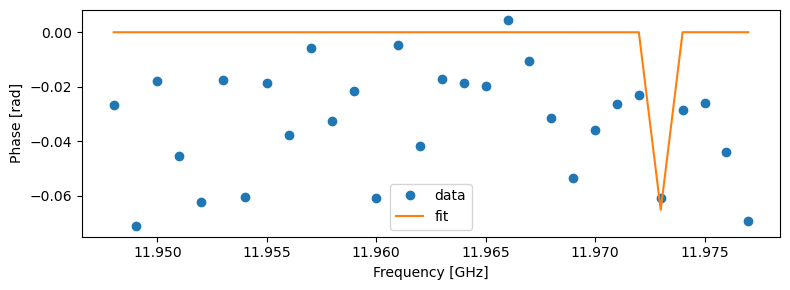

#87:  fr =  1.197300e+10 Hz   Ql = 2297067.8   |Qc| = 32882701.0   φ0 = 1.495


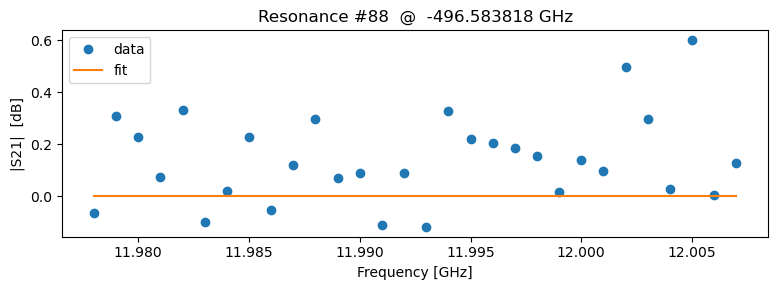

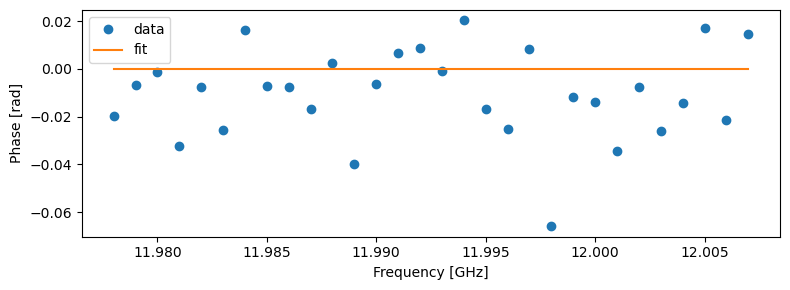

#88:  fr = -4.965838e+11 Hz   Ql = 15983703589960.5   |Qc| = 219008179940825.5   φ0 = 0.511


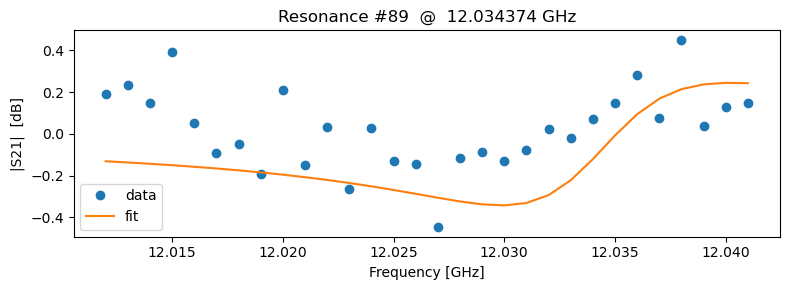

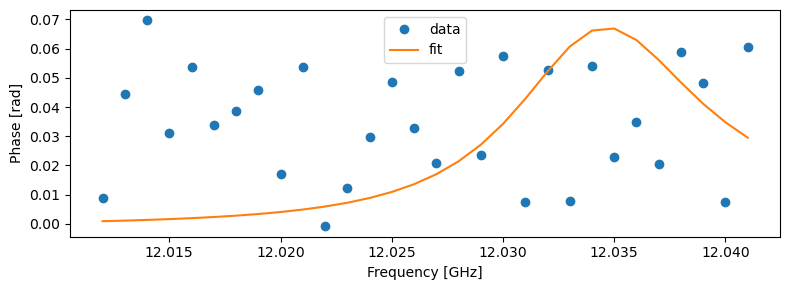

#89:  fr =  1.203437e+10 Hz   Ql = 1173.0   |Qc| = 17419.4   φ0 = -1.403


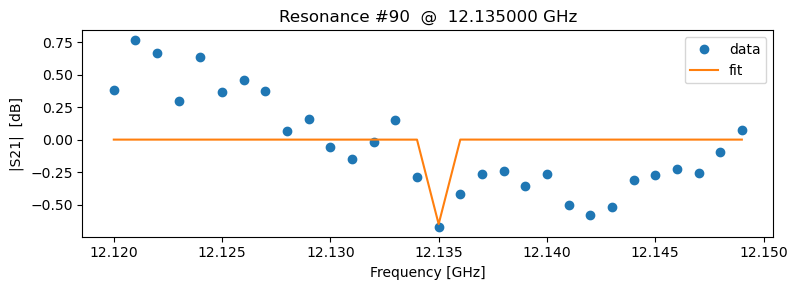

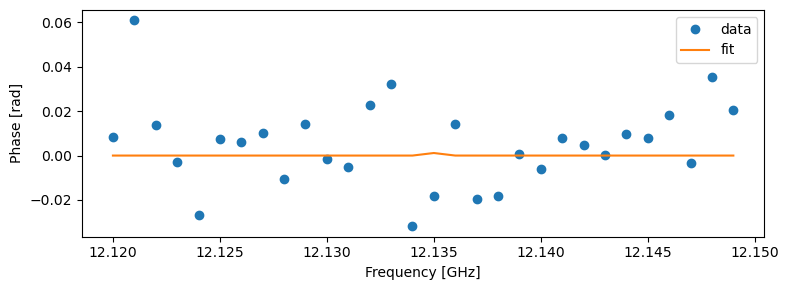

#90:  fr =  1.213500e+10 Hz   Ql = 126907175.7   |Qc| = 241322707.4   φ0 = -1.448


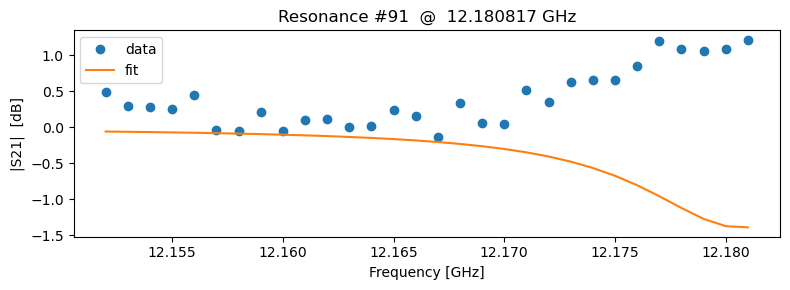

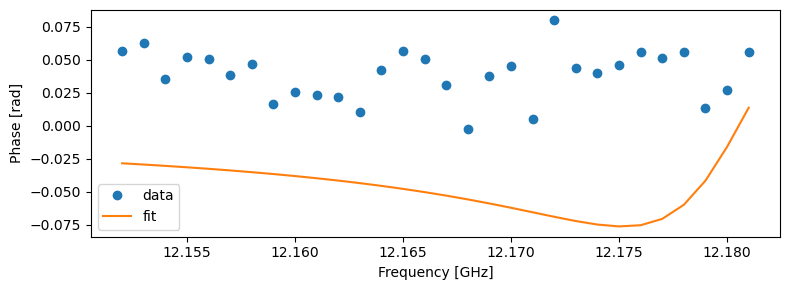

#91:  fr =  1.218082e+10 Hz   Ql = 1051.7   |Qc| = 7090.4   φ0 = -0.047


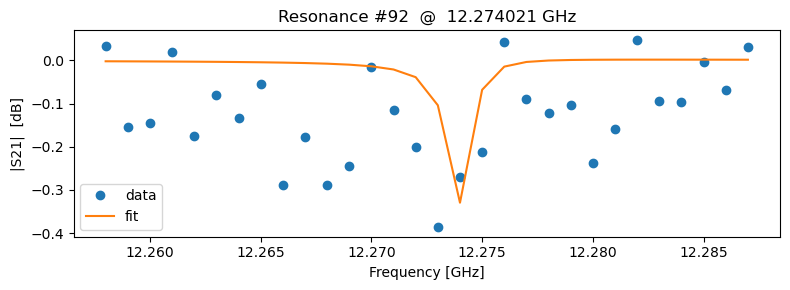

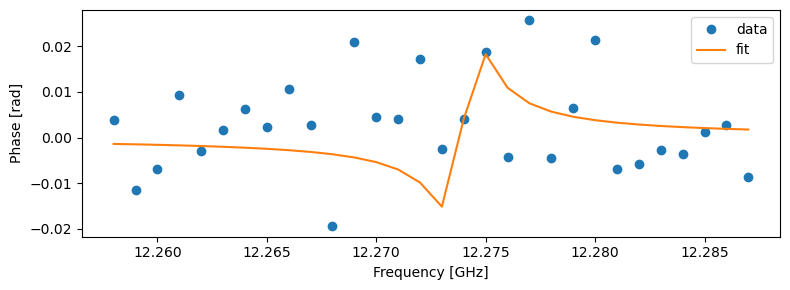

#92:  fr =  1.227402e+10 Hz   Ql = 10089.5   |Qc| = 269297.2   φ0 = -0.140


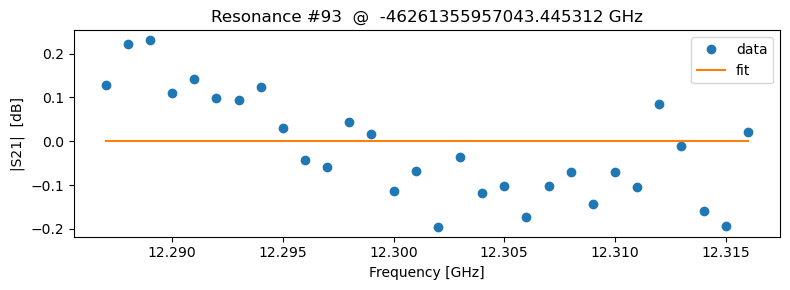

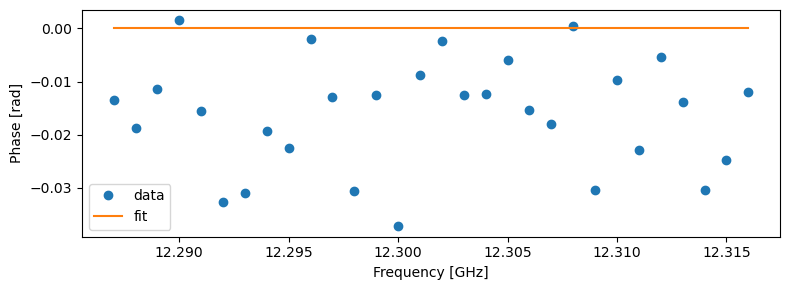

#93:  fr = -4.626136e+22 Hz   Ql = 840.9   |Qc| = 21754.8   φ0 = 1.537


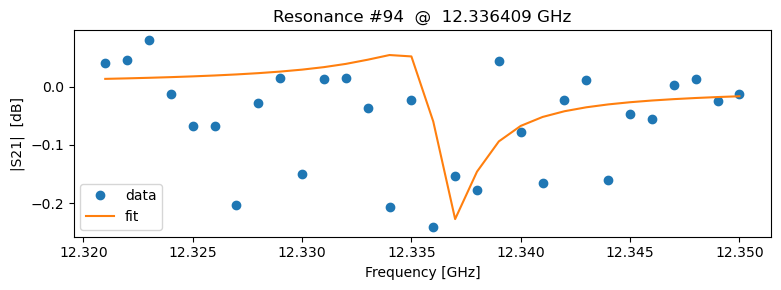

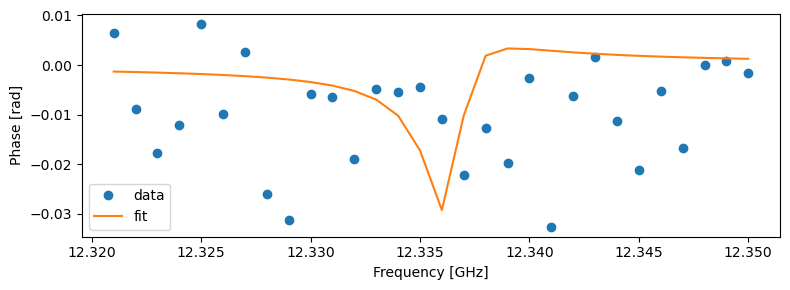

#94:  fr =  1.233641e+10 Hz   Ql = 6462.7   |Qc| = 198328.7   φ0 = 0.920


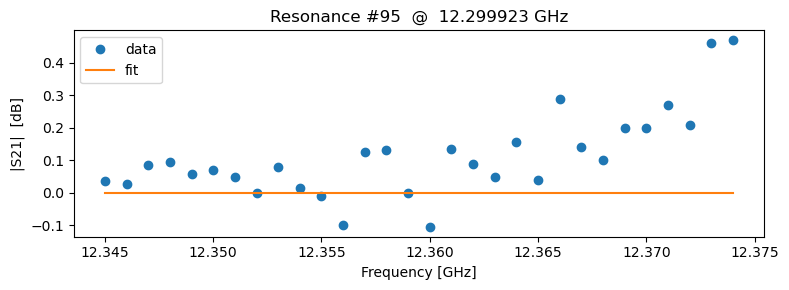

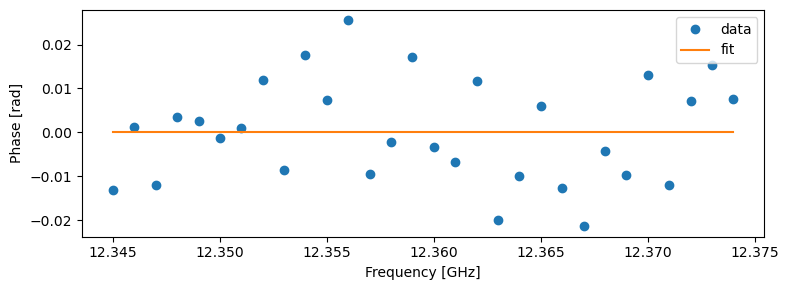

#95:  fr =  1.229992e+10 Hz   Ql = 281654925308486.6   |Qc| = 4929247149581100.0   φ0 = -0.516


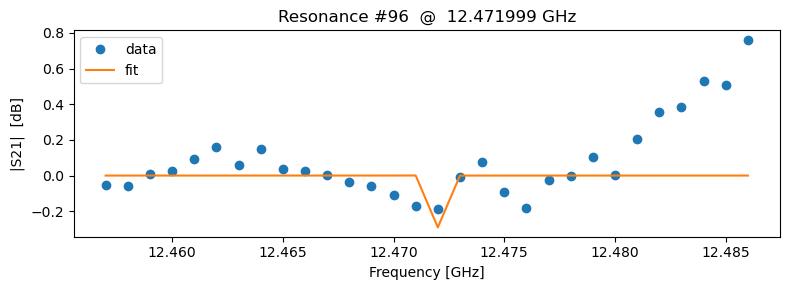

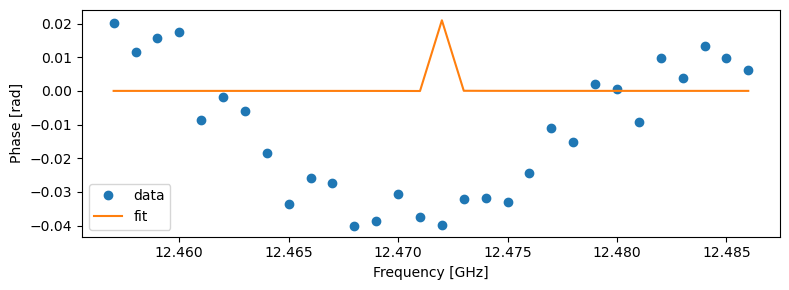

#96:  fr =  1.247200e+10 Hz   Ql = 14874669.2   |Qc| = 142640039.4   φ0 = 0.640


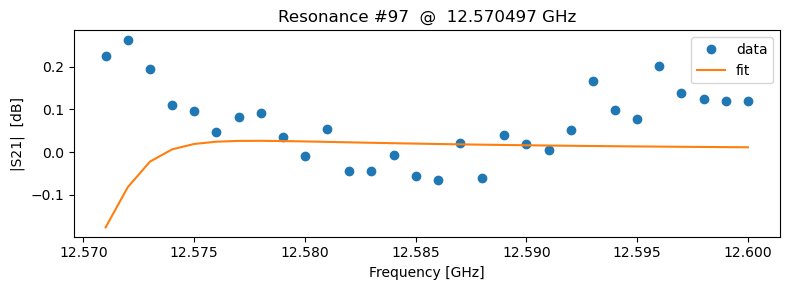

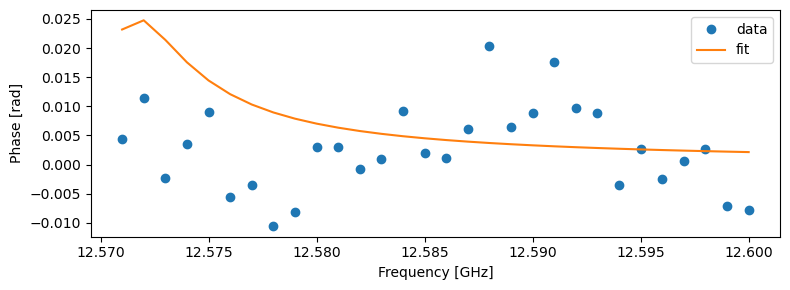

#97:  fr =  1.257050e+10 Hz   Ql = 2622.4   |Qc| = 84273.6   φ0 = -0.635


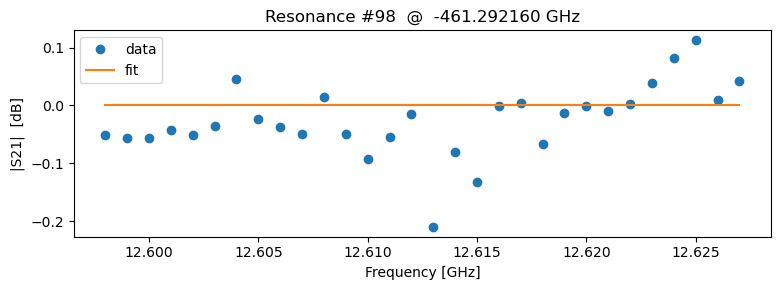

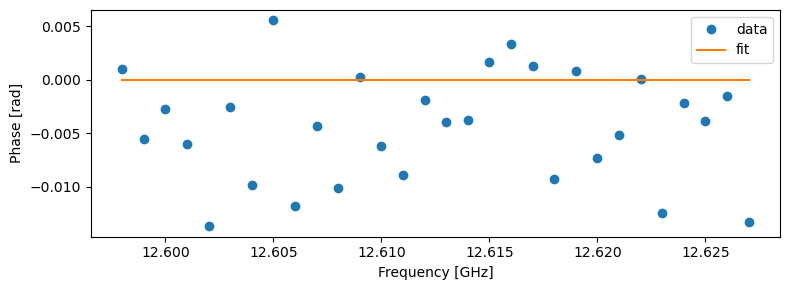

#98:  fr = -4.612922e+11 Hz   Ql = 4090058604861.2   |Qc| = 178940868054157.8   φ0 = 0.748


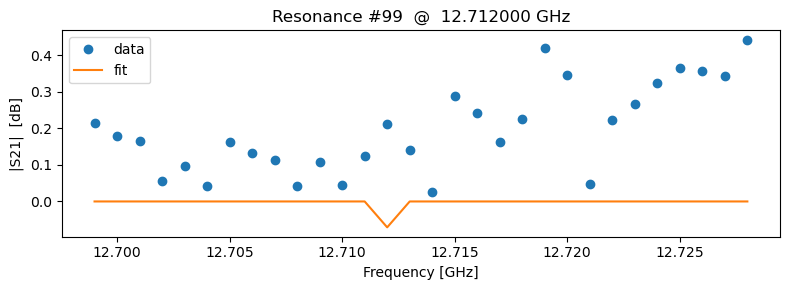

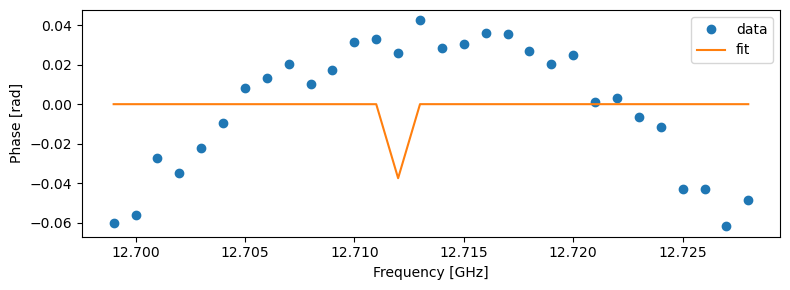

#99:  fr =  1.271200e+10 Hz   Ql = 62559895.1   |Qc| = 694654190.4   φ0 = 0.204


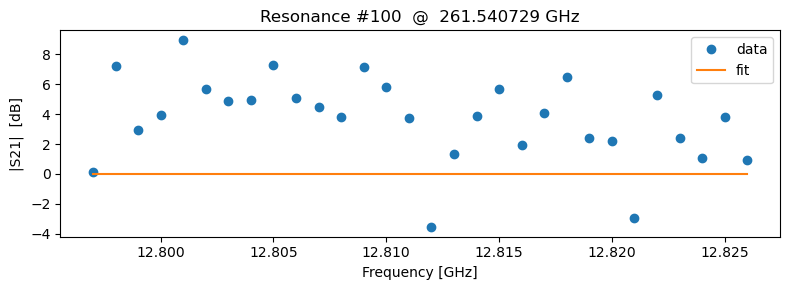

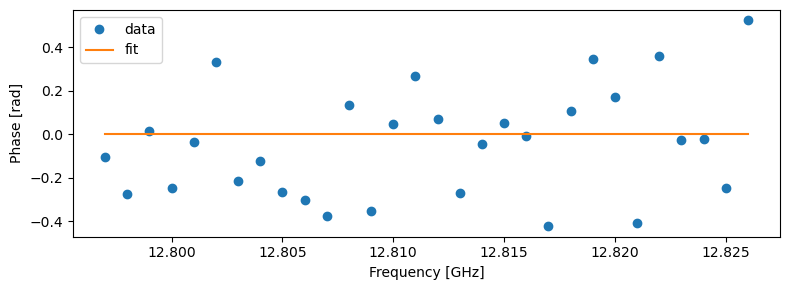

#100:  fr =  2.615407e+11 Hz   Ql = 80339846706305.9   |Qc| = 55781706776901.4   φ0 = 0.052


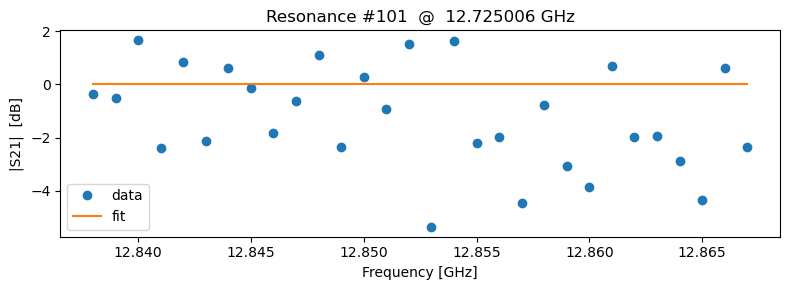

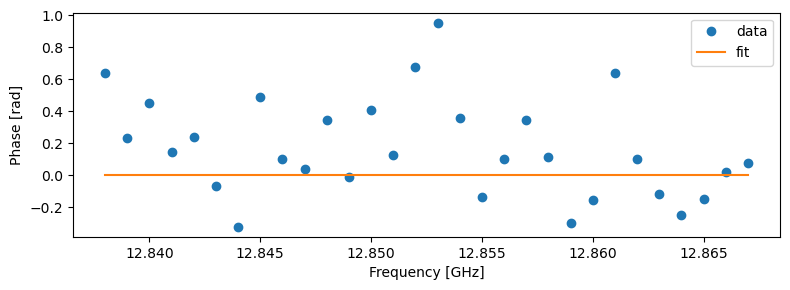

#101:  fr =  1.272501e+10 Hz   Ql = 1028496271996617.9   |Qc| = 1285117440439742.0   φ0 = -0.758


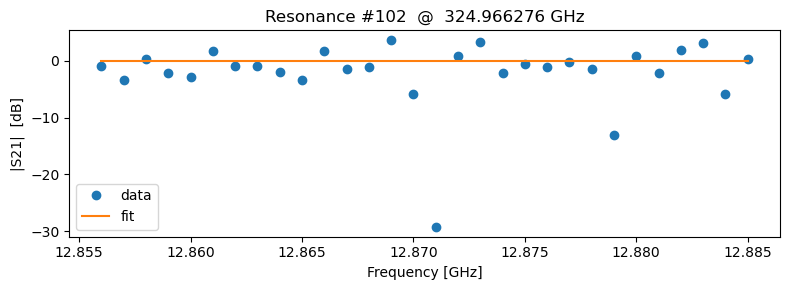

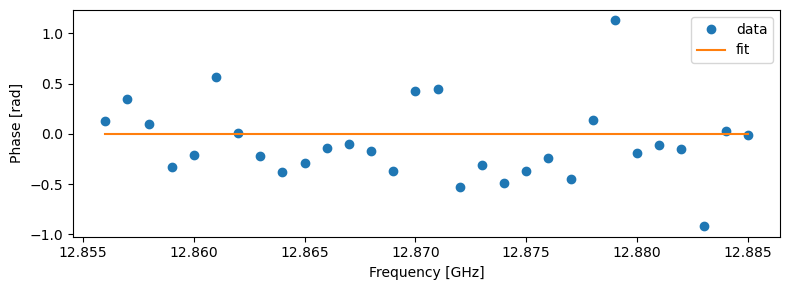

#102:  fr =  3.249663e+11 Hz   Ql = 72548684126897.0   |Qc| = 48343070522365.9   φ0 = 0.711


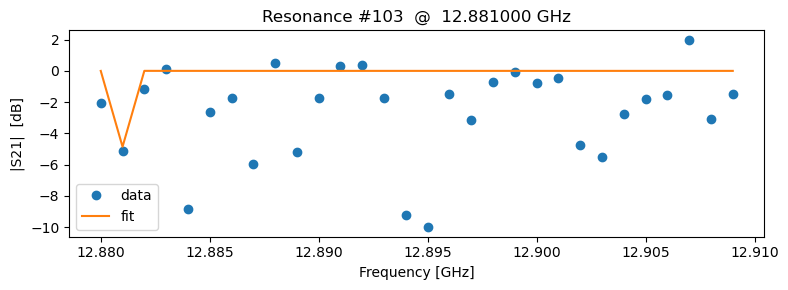

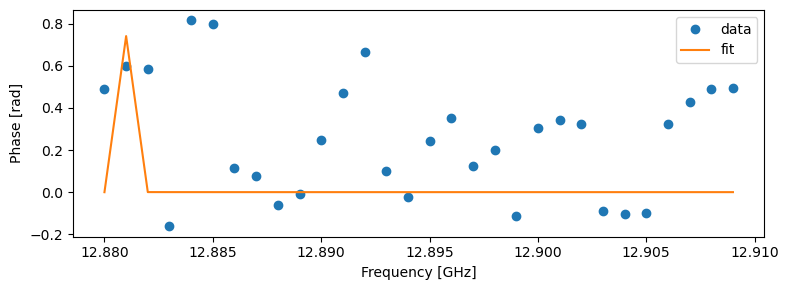

#103:  fr =  1.288100e+10 Hz   Ql = 14930592.6   |Qc| = 21461931.0   φ0 = -0.631


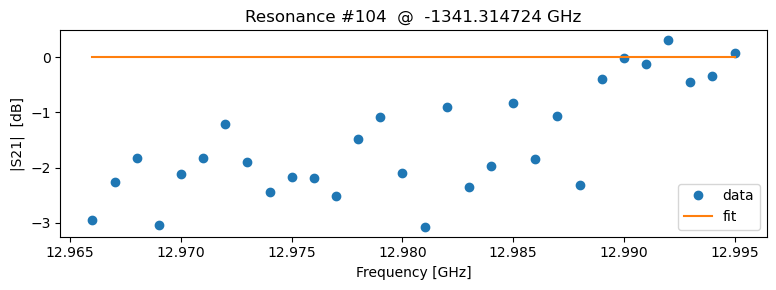

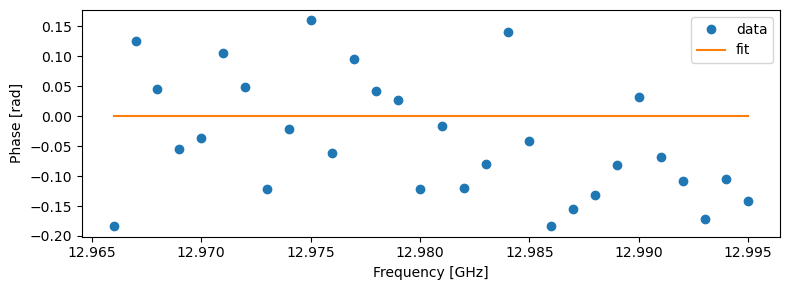

#104:  fr = -1.341315e+12 Hz   Ql = 315082956904104.2   |Qc| = 1133888913800828.8   φ0 = 0.202


In [57]:
from numpy import unwrap, exp
import matplotlib.pyplot as plt
import numpy as np

order = 15
unph  = unwrap(phase_trace)

for i, idx in enumerate(indices):

    if idx < order or idx + order > len(freq_trace):
        continue

    # ----- slice window -------------------------------------------------
    freq       = freq_trace[idx - order : idx + order]
    mag_db     = mag_trace[idx - order : idx + order]
    phase_data = unph[idx   - order : idx + order]

    # ----- dB → linear, build complex S21 -------------------------------
    mag_lin    = 10**(mag_db / 20)
    z_data_raw = mag_lin * exp(1j * phase_data)    

     # ----- fit ----------------------------------------------------------
    try:
        port = notch_port(f_data=freq, z_data_raw=z_data_raw)
        port.autofit()
    except Exception as e:
        print(f"Skipping resonance #{i+1} due to fit failure: {type(e).__name__}")
        continue


    # ----- plots --------------------------------------------------------
    plt.figure(figsize=(8,3))
    plt.plot(port.f_data/1e9, 20*np.log10(abs(port.z_data)),        'o', label='data')
    plt.plot(port.f_data/1e9, 20*np.log10(abs(port.z_data_sim_norm)),'-', label='fit')
    plt.xlabel('Frequency [GHz]');  plt.ylabel('|S21|  [dB]')
    plt.title(f'Resonance #{i+1}  @  {port.fitresults["fr"]/1e9:.6f} GHz')
    plt.legend();  plt.tight_layout();  plt.show()

    plt.figure(figsize=(8,3))
    plt.plot(port.f_data/1e9, np.angle(port.z_data),        'o', label='data')
    plt.plot(port.f_data/1e9, np.angle(port.z_data_sim_norm),'-', label='fit')
    plt.xlabel('Frequency [GHz]');  plt.ylabel('Phase [rad]')
    plt.legend();  plt.tight_layout();  plt.show()

    # ----- quick summary -----------------------------------------------
    fr  = port.fitresults['fr']
    Ql  = port.fitresults['Ql']
    Qc  = port.fitresults['absQc']
    phi = port.fitresults['phi0']
    print(f'#{i+1}:  fr = {fr: .6e} Hz   Ql = {Ql:.1f}   |Qc| = {Qc:.1f}   φ0 = {phi:.3f}')

As we can see most resonances do not display Lorentzian Behaviour. 
This is actually neither good or bad , since the resonances we are looking for will not have Lorentzian Shape. 
But it is interesting to keep track of the one we have proved to have Lorentzian shape. 